# Publication figures — clean, colour-blind-safe, and directly editable

This notebook keeps reusable data loading/statistical functions at the top. Each figure section then contains the **actual plotting code immediately before its display cell**, so individual figures can be edited without searching through a separate plotting module.

## 1. Reusable loading, statistics, transformations and data-preparation functions

In [1]:
from __future__ import annotations

import hashlib

import json

import math

import re

from collections.abc import Mapping

from pathlib import Path

from typing import Any, Iterable, Literal

import matplotlib

import matplotlib.pyplot as plt

import numpy as np

import pandas as pd

from IPython.display import Image as DisplayImage, display

from matplotlib.ticker import PercentFormatter

from PIL import Image

import torch

from torchvision import transforms

from torchvision.transforms import functional as transform_functional

from sklearn.metrics import (
    average_precision_score,
    brier_score_loss,
    precision_recall_fscore_support,
    roc_auc_score,
)

try:
    import cv2
except ImportError:
    cv2 = None
else:
    cv2.setNumThreads(0)

PROJECT_ROOT = Path.cwd().resolve()

SplitName = Literal["train", "validation", "test"]

DEFAULT_IMAGE_SIZE = 224

DEFAULT_NORMALISATION_MEAN = (0.485, 0.456, 0.406)

DEFAULT_NORMALISATION_STD = (0.229, 0.224, 0.225)

def _loss_name(weights: dict) -> str:
    return "_".join(
        f"{task}-{float(weights.get(task, 0)):g}"
        for task in ("genus", "species", "age")
    )

def _condition_parameter(
    condition: dict[str, Any], key: str, default: Any = None
) -> Any:
    """Read both saved canonical configs and already-resolved run configs."""
    parameters = condition.get("parameters", {}) or {}
    if isinstance(parameters, dict) and key in parameters:
        return parameters[key]
    return condition.get(key, default)

def collect_runs(paper_root: Path) -> pd.DataFrame:
    rows = []
    runs_root = paper_root / "runs"
    for config_path in sorted(runs_root.rglob("config.json")):
        run_dir = config_path.parent
        summary_path = run_dir / "run_summary.json"
        if not summary_path.is_file():
            continue
        config = _read_json(config_path)
        summary = _read_json(summary_path)
        parameter_path = run_dir / "model_parameters.json"
        parameter_counts = (
            _read_json(parameter_path) if parameter_path.is_file() else {}
        )
        relative = config_path.relative_to(runs_root)
        stage = relative.parts[0] if len(relative.parts) > 1 else "unknown"
        model = str((config.get("model", {}) or {}).get("name", "unknown"))
        weights = dict(
            (config.get("multi_task", {}) or {}).get("loss_weights", {}) or {}
        )
        hierarchy = dict(
            (config.get("multi_task", {}) or {}).get(
                "hierarchy_loss", {}
            )
            or {}
        )
        hierarchy_enabled = bool(hierarchy.get("enabled", False))
        hierarchy_weight = (
            float(hierarchy.get("weight", 0.0))
            if hierarchy_enabled else 0.0
        )
        condition = dict(config.get("input_condition", {}) or {})
        holdout = dict(config.get("data_holdout", {}) or {})
        label_path = run_dir / "label_to_index_by_task.json"
        label_maps = _read_json(label_path) if label_path.is_file() else {}
        class_counts = {
            task: len(labels)
            for task, labels in label_maps.items()
            if isinstance(labels, dict)
        }
        chances = {
            task: (
                1.0 / class_counts[task]
                if class_counts.get(task, 0) > 0
                else np.nan
            )
            for task in ("genus", "species", "age")
        }
        finite_chances = [
            value for value in chances.values() if pd.notna(value)
        ]
        mean_chance = (
            float(np.mean(finite_chances)) if finite_chances else np.nan
        )
        operations = _condition_parameter(condition, "operations", [])
        gaussian_percent = _condition_parameter(condition, "percent")
        paired_transform = None
        paired_level = None
        if isinstance(operations, list) and operations:
            gaussian_operation = next(
                (
                    item for item in operations
                    if isinstance(item, dict)
                    and item.get("transform") == "gaussian_blur_percent"
                ),
                {},
            )
            gaussian_percent = _condition_parameter(
                gaussian_operation, "percent"
            )
            paired = next(
                (
                    item for item in operations
                    if isinstance(item, dict)
                    and item.get("transform") != "gaussian_blur_percent"
                ),
                {},
            )
            paired_transform = paired.get("transform")
            paired_parameters = paired.get("parameters", {}) or {}
            paired_level = next(
                (
                    paired_parameters[key]
                    for key in ("percent", "grid_size", "retention")
                    if key in paired_parameters
                ),
                None,
            )
        max_sigma = _condition_parameter(condition, "max_sigma")
        rows.append({
            "stage": stage,
            "model": model,
            "seed": config.get("seed"),
            "total_parameters": (
                parameter_counts.get("total_parameters")
                or summary.get("total_parameters")
            ),
            "trainable_parameters": (
                parameter_counts.get("trainable_parameters")
                or summary.get("trainable_parameters")
            ),
            "pretrained": (config.get("model", {}) or {}).get("pretrained"),
            "learning_rate": (config.get("training", {}) or {}).get("lr"),
            "batch_size": (config.get("training", {}) or {}).get("batch_size"),
            "selection_metric": (
                (config.get("multi_task", {}) or {}).get("selection_metric")
                or summary.get("selection_metric")
            ),
            "loss_recipe": _loss_name(weights),
            "genus_weight": weights.get("genus"),
            "species_weight": weights.get("species"),
            "age_weight": weights.get("age"),
            "hierarchy_loss_enabled": hierarchy_enabled,
            "hierarchy_loss_weight": hierarchy_weight,
            "hierarchy_loss_label": f"h={hierarchy_weight:g}",
            "condition": (
                condition.get("condition")
                or condition.get("name")
                or "original"
            ),
            "transform": condition.get("transform", "original"),
            "strength": condition.get("strength", 0.0),
            "percent": _condition_parameter(condition, "percent"),
            "grid_size": _condition_parameter(condition, "grid_size"),
            "colour_retention": _condition_parameter(condition, "retention"),
            "gaussian_percent": gaussian_percent,
            "gaussian_max_sigma": max_sigma,
            "gaussian_sigma": (
                float(gaussian_percent) * float(max_sigma) / 100.0
                if gaussian_percent is not None and max_sigma is not None
                else (
                    float(gaussian_percent) * 64.0 / 100.0
                    if isinstance(operations, list) and operations
                    and gaussian_percent is not None
                    else np.nan
                )
            ),
            "paired_transform": paired_transform,
            "paired_level": paired_level,
            "operations": json.dumps(operations, sort_keys=True),
            "holdout": holdout.get("name"),
            "holdout_question": holdout.get("question"),
            "best_epoch": summary.get("best_epoch"),
            "best_val_score": summary.get("best_val_score"),
            "test_mean_macro_f1": summary.get("test_mean_macro_f1"),
            "test_genus_macro_f1": summary.get("test_genus_macro_f1"),
            "test_species_macro_f1": summary.get("test_species_macro_f1"),
            "test_age_macro_f1": summary.get("test_age_macro_f1"),
            "genus_class_count": class_counts.get("genus"),
            "species_class_count": class_counts.get("species"),
            "age_class_count": class_counts.get("age"),
            "chance_genus_macro_f1": chances["genus"],
            "chance_species_macro_f1": chances["species"],
            "chance_age_macro_f1": chances["age"],
            "chance_mean_macro_f1": mean_chance,
            "run_dir": str(run_dir),
        })
    return pd.DataFrame(rows)

def _split_paths(split_root: Path | None) -> dict[str, Path]:
    if split_root is None:
        return {}
    candidates = [split_root, split_root / "split_csv"]
    filenames = {
        "training": "train_split.csv",
        "validation": "val_split.csv",
        "test": "test_split.csv",
    }
    for candidate in candidates:
        paths = {
            split: candidate / filename
            for split, filename in filenames.items()
        }
        if all(path.is_file() for path in paths.values()):
            return paths
    return {}

def load_split_frames(
    split_root: Path | None,
) -> dict[str, pd.DataFrame]:
    return {
        split: pd.read_csv(path)
        for split, path in _split_paths(split_root).items()
    }

def dataset_composition_table(
    split_frames: dict[str, pd.DataFrame],
) -> pd.DataFrame:
    columns = [
        "genus",
        "species",
        "stage",
        "individuals",
        "images",
        "training_individuals",
        "training_images",
        "validation_individuals",
        "validation_images",
        "test_individuals",
        "test_images",
    ]
    if not split_frames:
        return pd.DataFrame(columns=columns)
    keys = ["genus", "species_label", "life_stage"]
    parts = []
    complete = []
    for split, frame in split_frames.items():
        available = frame.copy()
        for key in keys:
            if key not in available:
                available[key] = pd.NA
        grouped = (
            available.groupby(keys, dropna=False)
            .agg(
                **{
                    f"{split}_individuals": ("barcode", "nunique"),
                    f"{split}_images": ("barcode", "size"),
                }
            )
            .reset_index()
        )
        parts.append(grouped)
        tagged = available[keys + ["barcode"]].copy()
        complete.append(tagged)
    result = parts[0]
    for part in parts[1:]:
        result = result.merge(part, on=keys, how="outer")
    totals = (
        pd.concat(complete, ignore_index=True)
        .groupby(keys, dropna=False)
        .agg(individuals=("barcode", "nunique"), images=("barcode", "size"))
        .reset_index()
    )
    result = totals.merge(result, on=keys, how="left")
    count_columns = [
        column
        for column in result
        if column.endswith("_individuals")
        or column.endswith("_images")
        or column in {"individuals", "images"}
    ]
    result[count_columns] = result[count_columns].fillna(0).astype(int)
    result = result.rename(
        columns={"species_label": "species", "life_stage": "stage"}
    )
    return result[columns].sort_values(
        ["genus", "species", "stage"], na_position="last"
    )

def _read_json(path: Path) -> dict[str, Any]:
    try:
        value = json.loads(path.read_text(encoding="utf-8"))
    except (OSError, json.JSONDecodeError):
        return {}
    return value if isinstance(value, dict) else {}

def _read_csv(path: Path) -> pd.DataFrame:
    try:
        return pd.read_csv(path)
    except (OSError, pd.errors.EmptyDataError):
        return pd.DataFrame()

def _hierarchy_weight(config: dict[str, Any]) -> float:
    hierarchy = (
        (config.get("multi_task", {}) or {}).get("hierarchy_loss", {})
        or {}
    )
    if not bool(hierarchy.get("enabled", False)):
        return 0.0
    return float(hierarchy.get("weight", 0.0))

def _loss_recipe(config: dict[str, Any]) -> tuple[str, dict[str, float]]:
    weights = dict(
        ((config.get("multi_task", {}) or {}).get("loss_weights", {}) or {})
    )
    numeric = {
        task: float(weights.get(task, 0.0))
        for task in ("genus", "species", "age")
    }
    label = "_".join(
        f"{task}-{numeric[task]:g}"
        for task in ("genus", "species", "age")
    )
    return label, numeric

def _control_definitions(
    config: dict[str, Any],
) -> dict[str, dict[str, Any]]:
    definitions = (
        ((config.get("evaluation", {}) or {}).get(
            "data_holdout_controls", {}
        ) or {}).get("definitions", [])
    )
    return {
        str(item["name"]): item
        for item in definitions
        if isinstance(item, dict) and item.get("name")
    }

def _collect_stage(
    paper_root: Path,
    *,
    stage: str,
    evaluation_directory: str,
    training_regime: str,
) -> pd.DataFrame:
    frames: list[pd.DataFrame] = []
    pattern = f"{evaluation_directory}/task_metrics.csv"
    for path in sorted((paper_root / "runs" / stage).rglob(pattern)):
        frame = _read_csv(path)
        if frame.empty:
            continue
        enriched = _read_csv(
            path.with_name("target_class_metrics_full_test.csv")
        )
        if not enriched.empty:
            merge_keys = [
                column
                for column in ("holdout", "cohort", "task", "target_label")
                if column in frame and column in enriched
            ]
            added_columns = [
                column
                for column in enriched
                if column not in merge_keys and column not in frame
            ]
            if merge_keys and added_columns:
                frame = frame.merge(
                    enriched[[*merge_keys, *added_columns]],
                    on=merge_keys,
                    how="left",
                    validate="many_to_one",
                )
        run_dir = path.parents[1]
        config = _read_json(run_dir / "config.json")
        if not config:
            continue
        maps = _read_json(run_dir / "label_to_index_by_task.json")
        controls = _control_definitions(config)
        configured_holdout = config.get("data_holdout", {}) or {}
        weight = _hierarchy_weight(config)
        loss_recipe, loss_weights = _loss_recipe(config)
        frame = frame.copy()
        frame["model"] = (config.get("model", {}) or {}).get("name")
        frame["seed"] = config.get("seed")
        frame["hierarchy_loss_weight"] = weight
        frame["hierarchy_loss_label"] = f"h={weight:g}"
        frame["loss_recipe"] = loss_recipe
        frame["genus_weight"] = loss_weights["genus"]
        frame["species_weight"] = loss_weights["species"]
        frame["age_weight"] = loss_weights["age"]
        frame["training_regime"] = training_regime
        frame["run_dir"] = str(run_dir)
        for index, row in frame.iterrows():
            definition = (
                configured_holdout
                if training_regime == "adult_combo_withheld"
                else controls.get(str(row.get("holdout")), {})
            )
            where = (
                definition.get("evaluation_where")
                or definition.get("where")
                or {}
            )
            frame.at[index, "genus"] = where.get("genus")
            frame.at[index, "species"] = where.get("species")
            frame.at[index, "stage"] = where.get("age")
        frame["combo_label"] = (
            frame["stage"].fillna("Unknown").astype(str)
            + ": "
            + frame["species"].fillna(frame["holdout"])
            .astype(str).str.replace("_", " ", regex=False)
        )
        frame["chance"] = frame["task"].map({
            task: 1.0 / len(labels)
            for task, labels in maps.items()
            if isinstance(labels, dict) and labels
        })
        if "target_recall_image" not in frame:
            frame["target_recall_image"] = frame.get(
                "target_recall", np.nan
            )
        elif "target_recall" in frame:
            frame["target_recall_image"] = frame[
                "target_recall_image"
            ].fillna(frame["target_recall"])
        if "class_supported_by_training_head" not in frame:
            frame["class_supported_by_training_head"] = True
        frames.append(frame)
    return pd.concat(frames, ignore_index=True) if frames else pd.DataFrame()

def collect_adult_taxon_metrics(paper_root: Path) -> pd.DataFrame:
    controls = _collect_stage(
        paper_root,
        stage="adult_taxon_baseline",
        evaluation_directory="data_holdout_control_evaluation",
        training_regime="full_data_control",
    )
    withheld = _collect_stage(
        paper_root,
        stage="adult_taxon_holdouts",
        evaluation_directory="data_holdout_evaluation",
        training_regime="adult_combo_withheld",
    )
    frames = [item for item in (controls, withheld) if not item.empty]
    return pd.concat(frames, ignore_index=True) if frames else pd.DataFrame()

def _safe_divide(numerator: int | float, denominator: int | float) -> float:
    return float(numerator / denominator) if denominator else float("nan")

def _expected_calibration_error(
    truth: np.ndarray,
    probabilities: np.ndarray,
    *,
    bins: int = 10,
) -> float:
    """Binary equal-width ECE for one target class."""
    if truth.size == 0 or probabilities.size != truth.size:
        return float("nan")
    edges = np.linspace(0.0, 1.0, bins + 1)
    total = float(truth.size)
    value = 0.0
    for index in range(bins):
        lower, upper = edges[index], edges[index + 1]
        selected = (
            (probabilities >= lower) & (probabilities <= upper)
            if index == bins - 1
            else (probabilities >= lower) & (probabilities < upper)
        )
        if not selected.any():
            continue
        value += (
            float(selected.sum())
            / total
            * abs(float(truth[selected].mean()) - float(probabilities[selected].mean()))
        )
    return float(value)

def classification_metric_summary(
    y_true: np.ndarray | list[int],
    y_pred: np.ndarray | list[int],
    *,
    target_index: int | None = None,
    target_probabilities: np.ndarray | list[float] | None = None,
) -> dict[str, float | int]:
    """Return aggregate and one-vs-rest target metrics from one prediction set.

    Probability metrics are emitted only when target-class probabilities are
    available and both target/non-target examples occur. Hard-label metrics
    remain available for historical runs that saved predictions but no logits.
    """
    truth = np.asarray(y_true, dtype=int)
    prediction = np.asarray(y_pred, dtype=int)
    if truth.size == 0 or truth.size != prediction.size:
        return {"n": int(truth.size)}

    result: dict[str, float | int] = {"n": int(truth.size)}
    for average in ("macro", "micro", "weighted"):
        precision, recall, f1, _ = precision_recall_fscore_support(
            truth,
            prediction,
            average=average,
            zero_division=0,
        )
        result.update({
            f"precision_{average}": float(precision),
            f"recall_{average}": float(recall),
            f"f1_{average}": float(f1),
        })

    if target_index is None:
        return result

    target_truth = truth == int(target_index)
    target_prediction = prediction == int(target_index)
    tp = int(np.sum(target_truth & target_prediction))
    fp = int(np.sum(~target_truth & target_prediction))
    fn = int(np.sum(target_truth & ~target_prediction))
    tn = int(np.sum(~target_truth & ~target_prediction))
    precision = _safe_divide(tp, tp + fp)
    recall = _safe_divide(tp, tp + fn)
    specificity = _safe_divide(tn, tn + fp)
    negative_predictive_value = _safe_divide(tn, tn + fn)
    f1 = (
        float(2.0 * precision * recall / (precision + recall))
        if np.isfinite(precision) and np.isfinite(recall) and precision + recall
        else float("nan")
    )
    result.update({
        "target_tp": tp,
        "target_fp": fp,
        "target_fn": fn,
        "target_tn": tn,
        "target_n": int(target_truth.sum()),
        "target_predicted_n": int(target_prediction.sum()),
        "target_precision": precision,
        "target_recall": recall,
        "target_specificity": specificity,
        "target_negative_predictive_value": negative_predictive_value,
        "target_f1": f1,
    })

    if target_probabilities is None:
        return result
    probabilities = np.asarray(target_probabilities, dtype=float)
    if probabilities.size != truth.size:
        raise ValueError(
            "target_probabilities must align one-to-one with y_true"
        )
    if np.unique(target_truth).size < 2:
        return result
    binary_truth = target_truth.astype(int)
    result.update({
        "target_roc_auc": float(roc_auc_score(binary_truth, probabilities)),
        "target_average_precision": float(
            average_precision_score(binary_truth, probabilities)
        ),
        "target_brier_score": float(
            brier_score_loss(binary_truth, probabilities)
        ),
        "target_ece_10bin": _expected_calibration_error(
            binary_truth, probabilities, bins=10
        ),
    })
    return result

class ColourRetention:
    """Retain a deterministic fraction of image chroma."""

    def __init__(self, retention: float = 1.0):
        retention = float(retention)
        if not 0.0 <= retention <= 1.0:
            raise ValueError(
                f"colour_retention must be between 0 and 1, got {retention}."
            )
        self.retention = retention

    def __call__(self, image: torch.Tensor) -> torch.Tensor:
        if not torch.is_tensor(image):
            raise TypeError(
                "ColourRetention must be applied after transforms.ToTensor()."
            )
        if image.ndim != 3 or image.shape[0] != 3:
            raise ValueError(
                f"Expected an RGB tensor with shape [3, H, W], got {tuple(image.shape)}."
            )
        if self.retention == 1.0:
            return image
        greyscale = transform_functional.rgb_to_grayscale(
            image, num_output_channels=3
        )
        return torch.lerp(greyscale, image, self.retention).clamp_(0.0, 1.0)

    def __repr__(self) -> str:
        return f"{self.__class__.__name__}(retention={self.retention:.3f})"

class ChannelShuffle:
    """Apply a fixed RGB-channel permutation."""

    def __init__(self, order: tuple[int, int, int] | list[int]):
        self.order = tuple(int(index) for index in order)
        if sorted(self.order) != [0, 1, 2]:
            raise ValueError(
                f"Channel order must be a permutation of [0, 1, 2], got {self.order}."
            )

    def __call__(self, image: torch.Tensor) -> torch.Tensor:
        if image.ndim != 3 or image.shape[0] != 3:
            raise ValueError(
                f"Expected an RGB tensor with shape [3, H, W], got {tuple(image.shape)}."
            )
        return image[list(self.order), :, :]

    def __repr__(self) -> str:
        return f"{self.__class__.__name__}(order={self.order})"

class BinaryForegroundMask:
    """Replace RGB values with a three-channel binary foreground silhouette."""

    def __init__(self, threshold: float = 5.0 / 255.0):
        self.threshold = float(threshold)
        if not 0.0 <= self.threshold <= 1.0:
            raise ValueError(
                "Binary-mask threshold must be in [0, 1], got "
                f"{self.threshold}."
            )

    def __call__(self, image: torch.Tensor) -> torch.Tensor:
        if not torch.is_tensor(image):
            raise TypeError(
                "BinaryForegroundMask must be applied after transforms.ToTensor()."
            )
        if image.ndim != 3 or image.shape[0] != 3:
            raise ValueError(
                "Expected an RGB tensor with shape [3, H, W], got "
                f"{tuple(image.shape)}."
            )
        foreground = image.amax(dim=0, keepdim=True).gt(self.threshold)
        return foreground.to(dtype=image.dtype).expand_as(image).clone()

    def __repr__(self) -> str:
        return f"{self.__class__.__name__}(threshold={self.threshold:.6f})"

class TensorGaussianBlur:
    """Gaussian smoothing applied before ImageNet normalisation."""

    def __init__(self, sigma: float):
        self.sigma = float(sigma)
        if self.sigma <= 0:
            raise ValueError(f"Gaussian sigma must be > 0, got {self.sigma}.")
        self.kernel_size = max(3, 2 * int(math.ceil(3.0 * self.sigma)) + 1)

    def __call__(self, image: torch.Tensor) -> torch.Tensor:
        return transform_functional.gaussian_blur(
            image,
            kernel_size=[self.kernel_size, self.kernel_size],
            sigma=[self.sigma, self.sigma],
        )

    def __repr__(self) -> str:
        return (
            f"{self.__class__.__name__}(sigma={self.sigma:.3f}, "
            f"kernel_size={self.kernel_size})"
        )

class GaussianBlurPercent:
    """Blur an image by an obvious 0-100 severity percentage."""

    def __init__(self, percent: float, max_sigma: float = 16.0):
        self.percent = float(percent)
        self.max_sigma = float(max_sigma)
        if not 0.0 <= self.percent <= 100.0:
            raise ValueError(
                f"Gaussian blur percent must be in [0, 100], got {self.percent}."
            )
        if self.max_sigma <= 0:
            raise ValueError(
                f"Gaussian blur max_sigma must be > 0, got {self.max_sigma}."
            )
        self.sigma = self.max_sigma * self.percent / 100.0

    def __call__(self, image: torch.Tensor) -> torch.Tensor:
        if self.percent == 0.0:
            return image
        kernel_size = max(3, 2 * int(math.ceil(3.0 * self.sigma)) + 1)
        return transform_functional.gaussian_blur(
            image,
            kernel_size=[kernel_size, kernel_size],
            sigma=[self.sigma, self.sigma],
        )

    def __repr__(self) -> str:
        return (
            f"{self.__class__.__name__}(percent={self.percent:.1f}, "
            f"max_sigma={self.max_sigma:.3f}, sigma={self.sigma:.3f})"
        )

class ResolutionLoss:
    """Discard 0-100% spatial resolution, then restore the original shape."""

    def __init__(self, percent: float):
        self.percent = float(percent)
        if not 0.0 <= self.percent <= 100.0:
            raise ValueError(
                f"Resolution-loss percent must be in [0, 100], got {self.percent}."
            )

    def __call__(self, image: torch.Tensor) -> torch.Tensor:
        if image.ndim != 3:
            raise ValueError(f"Expected [C, H, W], got {tuple(image.shape)}.")
        if self.percent == 0.0:
            return image
        height, width = image.shape[-2:]
        retained_fraction = 1.0 - self.percent / 100.0
        reduced_height = max(1, int(round(height * retained_fraction)))
        reduced_width = max(1, int(round(width * retained_fraction)))
        reduced = transform_functional.resize(
            image,
            [reduced_height, reduced_width],
            interpolation=transforms.InterpolationMode.BILINEAR,
            antialias=True,
        )
        return transform_functional.resize(
            reduced,
            [height, width],
            interpolation=transforms.InterpolationMode.BILINEAR,
            antialias=True,
        )

    def __repr__(self) -> str:
        return f"{self.__class__.__name__}(percent={self.percent:.1f})"

class TensorBilateralFilter:
    """Edge-preserving bilateral smoothing using OpenCV."""

    def __init__(self, diameter: int, sigma_colour: float, sigma_space: float):
        self.diameter = int(diameter)
        self.sigma_colour = float(sigma_colour)
        self.sigma_space = float(sigma_space)
        if self.diameter <= 0 or self.diameter % 2 == 0:
            raise ValueError(
                "Bilateral diameter must be a positive odd integer, "
                f"got {self.diameter}."
            )
        if self.sigma_colour <= 0 or self.sigma_space <= 0:
            raise ValueError("Bilateral sigma values must be greater than zero.")

    def __call__(self, image: torch.Tensor) -> torch.Tensor:
        if cv2 is None:
            raise ImportError(
                "OpenCV is required for bilateral filtering. Install opencv-python "
                "or opencv-python-headless in the training environment."
            )
        if image.ndim != 3 or image.shape[0] != 3:
            raise ValueError(
                f"Expected an RGB tensor with shape [3, H, W], got {tuple(image.shape)}."
            )
        array = image.detach().cpu().permute(1, 2, 0).numpy()
        array_u8 = np.rint(np.clip(array, 0.0, 1.0) * 255.0).astype(np.uint8)
        filtered = cv2.bilateralFilter(
            array_u8,
            d=self.diameter,
            sigmaColor=self.sigma_colour,
            sigmaSpace=self.sigma_space,
        )
        output = torch.from_numpy(filtered).permute(2, 0, 1).to(dtype=image.dtype)
        return output.div_(255.0)

    def __repr__(self) -> str:
        return (
            f"{self.__class__.__name__}(diameter={self.diameter}, "
            f"sigma_colour={self.sigma_colour:.3f}, "
            f"sigma_space={self.sigma_space:.3f})"
        )

class PatchShuffle:
    """Deterministically shuffle a regular image-patch grid."""

    def __init__(self, grid_size: int, seed: int = 0):
        self.grid_size = int(grid_size)
        self.seed = int(seed)
        if self.grid_size < 2:
            raise ValueError("Patch-shuffle grid_size must be at least 2.")
        generator = torch.Generator().manual_seed(
            self.seed + 1009 * self.grid_size
        )
        patch_count = self.grid_size * self.grid_size
        permutation = torch.randperm(patch_count, generator=generator)
        if torch.equal(permutation, torch.arange(patch_count)):
            permutation = permutation.roll(1)
        self.permutation = permutation.tolist()

    def __call__(self, image: torch.Tensor) -> torch.Tensor:
        if image.ndim != 3:
            raise ValueError(f"Expected [C, H, W], got {tuple(image.shape)}.")
        _, height, width = image.shape
        if height % self.grid_size != 0 or width % self.grid_size != 0:
            raise ValueError(
                f"Image size {(height, width)} must be divisible by patch grid "
                f"{self.grid_size}. Choose a compatible grid size."
            )
        patch_height = height // self.grid_size
        patch_width = width // self.grid_size
        output = torch.empty_like(image)
        for destination, source in enumerate(self.permutation):
            destination_row, destination_column = divmod(
                destination, self.grid_size
            )
            source_row, source_column = divmod(source, self.grid_size)
            output[
                :,
                destination_row * patch_height:(destination_row + 1) * patch_height,
                destination_column * patch_width:(destination_column + 1) * patch_width,
            ] = image[
                :,
                source_row * patch_height:(source_row + 1) * patch_height,
                source_column * patch_width:(source_column + 1) * patch_width,
            ]
        return output

    def __repr__(self) -> str:
        return f"{self.__class__.__name__}(grid_size={self.grid_size}, seed={self.seed})"

def _condition_parameters(condition: dict) -> dict:
    """Resolve canonical nested parameters plus legacy flat parameters once."""
    raw_parameters = condition.get("parameters", {}) or {}
    if not isinstance(raw_parameters, dict):
        raise TypeError("input condition parameters must be a mapping")
    parameters = dict(raw_parameters)
    for key in (
        "retention",
        "order",
        "diameter",
        "sigma_colour",
        "sigma_space",
        "sigma",
        "grid_size",
        "seed",
        "percent",
        "max_sigma",
        "threshold",
        "operations",
    ):
        if key in condition:
            parameters[key] = condition[key]
    return parameters

def build_condition_operations(
    condition: dict | None = None,
    original_colour_retention: float = 1.0,
) -> list:
    """Build the tensor-stage operations for one experimental condition."""
    condition = dict(condition or {})
    transform_name = str(condition.get("transform", "original")).lower()
    parameters = _condition_parameters(condition)

    if transform_name == "composed":
        configured = parameters.get("operations")
        if not isinstance(configured, list) or not configured:
            raise ValueError(
                "composed input conditions require a non-empty operations list"
            )
        operations = []
        for index, operation in enumerate(configured):
            if not isinstance(operation, dict):
                raise TypeError(
                    f"composed operation {index} must be a mapping"
                )
            nested_transform = str(
                operation.get("transform", "original")
            ).lower()
            if nested_transform in {"original", "composed"}:
                raise ValueError(
                    "composed operations must be non-original, non-composed "
                    f"transforms; got {nested_transform!r} at index {index}"
                )
            operations.extend(build_condition_operations(operation))
        return operations

    if transform_name == "saturation":
        retention = float(parameters["retention"])
    elif transform_name == "grayscale":
        retention = 0.0
    else:
        retention = float(original_colour_retention)
    operations = [ColourRetention(retention)]

    if transform_name in {"original", "saturation", "grayscale"}:
        pass
    elif transform_name == "channel_shuffle":
        operations.append(ChannelShuffle(parameters.get("order", [2, 0, 1])))
    elif transform_name == "gaussian_blur":
        operations.append(TensorGaussianBlur(float(parameters["sigma"])))
    elif transform_name == "gaussian_blur_percent":
        operations.append(GaussianBlurPercent(
            percent=float(parameters["percent"]),
            max_sigma=float(parameters.get("max_sigma", 16.0)),
        ))
    elif transform_name == "resolution_loss":
        operations.append(ResolutionLoss(float(parameters["percent"])))
    elif transform_name == "bilateral_filter":
        operations.append(TensorBilateralFilter(
            diameter=int(parameters["diameter"]),
            sigma_colour=float(parameters["sigma_colour"]),
            sigma_space=float(parameters["sigma_space"]),
        ))
    elif transform_name == "patch_shuffle":
        operations.append(PatchShuffle(
            grid_size=int(parameters["grid_size"]),
            seed=int(parameters.get("seed", 0)),
        ))
    elif transform_name == "binary_mask":
        operations.append(BinaryForegroundMask(
            threshold=float(parameters.get("threshold", 5.0 / 255.0)),
        ))
    else:
        raise ValueError(f"Unsupported input transform: {transform_name!r}.")
    return operations

def _mapping(value, path: str) -> dict:
    if value is None:
        return {}
    if not isinstance(value, Mapping):
        raise TypeError(f"{path} must be a mapping")
    return dict(value)

def _enabled_operation(config: dict, key: str, defaults: dict) -> dict | None:
    operation = {**defaults, **_mapping(config.get(key), f"augmentation.{key}")}
    return operation if bool(operation.get("enabled", True)) else None

def _augmentation_operations(augmentation: Mapping | None) -> list:
    config = _mapping(augmentation, "augmentation")
    if not bool(config.get("enabled", True)):
        return []

    operations = []
    horizontal = _enabled_operation(
        config,
        "horizontal_flip",
        {"enabled": True, "probability": 0.5},
    )
    if horizontal is not None:
        operations.append(
            transforms.RandomHorizontalFlip(p=float(horizontal["probability"]))
        )

    vertical = _enabled_operation(
        config,
        "vertical_flip",
        {"enabled": True, "probability": 0.5},
    )
    if vertical is not None:
        operations.append(
            transforms.RandomVerticalFlip(p=float(vertical["probability"]))
        )

    rotation = _enabled_operation(
        config,
        "rotation",
        {"enabled": True, "degrees": 270},
    )
    if rotation is not None:
        # Keep RandomRotation(0) when enabled: removing it would change RNG
        # consumption and therefore later stochastic samples.
        operations.append(
            transforms.RandomRotation(degrees=float(rotation["degrees"]))
        )

    gaussian = _enabled_operation(
        config,
        "gaussian_blur",
        {
            "enabled": False,
            "probability": 0.5,
            "kernel_size": 5,
            "sigma": [0.1, 2.0],
        },
    )
    if gaussian is not None:
        sigma = tuple(float(value) for value in gaussian["sigma"])
        operations.append(
            transforms.RandomApply(
                [
                    transforms.GaussianBlur(
                        kernel_size=int(gaussian["kernel_size"]),
                        sigma=sigma,
                    )
                ],
                p=float(gaussian["probability"]),
            )
        )
    return operations

def _normalisation_operation(preprocessing: dict):
    config = _mapping(
        preprocessing.get("normalisation"),
        "preprocessing.normalisation",
    )
    if not bool(config.get("enabled", True)):
        return None
    return transforms.Normalize(
        mean=config.get("mean", list(DEFAULT_NORMALISATION_MEAN)),
        std=config.get("std", list(DEFAULT_NORMALISATION_STD)),
    )

def build_split_transform(
    *,
    split: SplitName,
    preprocessing: Mapping | None = None,
    augmentation: Mapping | None = None,
    condition: Mapping | None = None,
    original_colour_retention: float = 1.0,
    apply_augmentation: bool | None = None,
    condition_precomputed: bool = False,
) -> transforms.Compose:
    """Compose deterministic preprocessing, augmentation, and input condition.

    Augmentation is train-only unless a diagnostic caller explicitly overrides
    ``apply_augmentation``. Experimental conditions are tensor operations and
    always precede normalisation.
    """
    if split not in {"train", "validation", "test"}:
        raise ValueError(
            f"split must be 'train', 'validation', or 'test', got {split!r}"
        )
    preprocessing_config = _mapping(preprocessing, "preprocessing")
    image_size = preprocessing_config.get("image_size", DEFAULT_IMAGE_SIZE)
    if (
        isinstance(image_size, bool)
        or not isinstance(image_size, int)
        or image_size <= 0
    ):
        raise ValueError("preprocessing.image_size must be a positive integer")

    operations = [transforms.Resize((image_size, image_size))]
    augment = (
        split == "train"
        if apply_augmentation is None
        else apply_augmentation
    )
    if augment:
        operations.extend(_augmentation_operations(augmentation))
    if not condition_precomputed:
        operations.append(transforms.ToTensor())
        operations.extend(
            build_condition_operations(
                _mapping(condition, "input_condition"),
                original_colour_retention=original_colour_retention,
            )
        )
    normalisation = _normalisation_operation(preprocessing_config)
    if normalisation is not None:
        operations.append(normalisation)
    return transforms.Compose(operations)

PALETTE = (
    "#0072B2", "#E69F00", "#009E73", "#CC79A7", "#56B4E9",
    "#D55E00", "#F0E442", "#000000",
)

HEATMAP_CMAP = "cividis"

TASK_ORDER = ("genus", "species", "age")

TASK_LABELS = {
    "genus": "Genus",
    "species": "Species",
    "age": "Developmental stage",
}

BASELINE_RECIPE = _loss_name({"genus": 1.0, "species": 0.5, "age": 2.0})

PAPER_LOSS_WEIGHTS = {"genus": 1.0, "species": 0.5, "age": 2.0}

PAPER_SEEDS = tuple(range(40, 2941, 100))

TEST_COHORT = "independent_test"

TAXON_MODEL = "convnext_base"

T_CRITICAL = {1: 12.706, 2: 4.303, 3: 3.182, 4: 2.776}

ABLATION_BOOTSTRAP_RESAMPLES = 10_000

ABLATION_BOOTSTRAP_SEED = 20260804

ABLATION_INTERVAL_LEVEL = 0.95

INPUT_SIZE = 224

def _deterministic_jitter(
    values: Iterable[object], *, width: float = 0.08
) -> np.ndarray:
    """Stable jitter keyed by seed/identity rather than row ordering."""
    offsets = []
    for value in values:
        digest = hashlib.sha256(str(value).encode("utf-8")).digest()
        unit = int.from_bytes(digest[:8], "big") / float(2**64 - 1)
        offsets.append((unit - 0.5) * 2.0 * width)
    return np.asarray(offsets, dtype=float)

def _interval_text(mean: float, half_width: float) -> str:
    if not np.isfinite(mean):
        return ""
    if not np.isfinite(half_width):
        return f"{mean:.1%}"
    low = max(0.0, mean - half_width)
    high = min(1.0, mean + half_width)
    return f"{mean:.1%}\n[{low:.1%}, {high:.1%}]"

def _slug(value: object) -> str:
    text = re.sub(r"[^a-zA-Z0-9]+", "_", str(value)).strip("_").lower()
    return text or "unnamed"

def _display_model(value: object) -> str:
    labels = {
        "resnet50": "ResNet-50",
        "convnext_base": "ConvNeXt-Base",
        "vit_b_16": "ViT-B/16",
        "dinov3_vitb16": "DINOv3 ViT-B/16",
        "dinov3_convnext_base": "DINOv3 ConvNeXt-Base",
    }
    return labels.get(str(value), str(value).replace("_", " "))

def _supported(frame: pd.DataFrame) -> pd.DataFrame:
    if "class_supported_by_training_head" not in frame:
        return frame.copy()
    supported = frame["class_supported_by_training_head"]
    if supported.dtype == bool:
        mask = supported
    else:
        mask = supported.astype(str).str.lower().isin({"true", "1", "yes"})
    return frame[mask].copy()

def _h0(frame: pd.DataFrame) -> pd.DataFrame:
    if frame.empty or "hierarchy_loss_weight" not in frame:
        return frame.copy()
    weight = pd.to_numeric(frame["hierarchy_loss_weight"], errors="coerce").fillna(0.0)
    return frame[weight.eq(0.0)].copy()

def _paper_design_only(
    frame: pd.DataFrame,
    *,
    require_loss_recipe: bool = False,
) -> pd.DataFrame:
    """Keep only h=0, the one paper loss recipe, and publication seeds."""
    if frame.empty:
        return frame.copy()
    if require_loss_recipe and "hierarchy_loss_weight" not in frame:
        raise ValueError(
            "Paper figures require hierarchy_loss_weight; refusing to mix "
            "unknown hierarchy-loss configurations."
        )
    if require_loss_recipe:
        hierarchy_values = pd.to_numeric(
            frame["hierarchy_loss_weight"], errors="coerce"
        )
        if hierarchy_values.isna().any():
            raise ValueError(
                "Some runs have no recoverable hierarchy-loss setting; "
                "rerun collection from directories containing config.json."
            )
    selected = _h0(frame)
    if selected.empty:
        return selected
    if "seed" not in selected:
        raise ValueError("Paper figures require an explicit seed column")
    seeds = pd.to_numeric(selected["seed"], errors="coerce")
    if require_loss_recipe and seeds.isna().any():
        raise ValueError(
            "Some runs have no recoverable seed; rerun collection from "
            "directories containing config.json."
        )
    selected = selected[seeds.isin(PAPER_SEEDS)].copy()
    if "loss_recipe" in selected:
        recipes = selected["loss_recipe"].replace("", np.nan)
        if require_loss_recipe and recipes.isna().any():
            raise ValueError(
                "Some runs have no recoverable loss recipe; rerun collection "
                "from directories containing config.json."
            )
        selected = selected[recipes.eq(BASELINE_RECIPE)].copy()
    else:
        weight_columns = {
            task: f"{task}_weight" for task in PAPER_LOSS_WEIGHTS
        }
        if all(column in selected for column in weight_columns.values()):
            mask = pd.Series(True, index=selected.index)
            for task, expected in PAPER_LOSS_WEIGHTS.items():
                values = pd.to_numeric(
                    selected[weight_columns[task]], errors="coerce"
                )
                mask &= np.isclose(values, expected)
            selected = selected[mask].copy()
        elif require_loss_recipe:
            raise ValueError(
                "Paper figures require loss_recipe or explicit genus/species/age "
                "weight columns; refusing to mix loss-weight configurations."
            )
    return selected

def _paper_design_manifest() -> dict:
    return {
        "seeds": list(PAPER_SEEDS),
        "hierarchy_loss_weight": 0.0,
        "loss_recipe": BASELINE_RECIPE,
        "loss_weights": PAPER_LOSS_WEIGHTS,
    }

def _model_only(frame: pd.DataFrame, model: str, *, context: str) -> pd.DataFrame:
    """Fail closed when a figure's required model identity is unavailable."""
    if frame.empty:
        return frame.copy()
    if "model" not in frame:
        raise ValueError(f"{context} require an explicit model column")
    return frame[frame["model"].astype(str).eq(model)].copy()

def _attach_run_design_metadata(frame: pd.DataFrame) -> pd.DataFrame:
    """Recover design columns from run configs for older collected metrics."""
    result = frame.copy()
    if result.empty or "run_dir" not in result:
        return result
    metadata: dict[str, dict[str, object]] = {}
    for run_dir_value in result["run_dir"].dropna().astype(str).unique():
        config_path = Path(run_dir_value) / "config.json"
        try:
            config = json.loads(config_path.read_text(encoding="utf-8"))
        except (OSError, json.JSONDecodeError):
            continue
        multi_task = dict(config.get("multi_task", {}) or {})
        weights = dict(multi_task.get("loss_weights", {}) or {})
        numeric_weights = {
            task: float(weights.get(task, 0.0))
            for task in ("genus", "species", "age")
        }
        hierarchy = dict(multi_task.get("hierarchy_loss", {}) or {})
        hierarchy_weight = (
            float(hierarchy.get("weight", 0.0))
            if bool(hierarchy.get("enabled", False)) else 0.0
        )
        metadata[run_dir_value] = {
            "seed": config.get("seed"),
            "hierarchy_loss_weight": hierarchy_weight,
            "loss_recipe": _loss_name(numeric_weights),
            **{
                f"{task}_weight": value
                for task, value in numeric_weights.items()
            },
        }
    if not metadata:
        return result
    run_dirs = result["run_dir"].astype(str)
    for column in (
        "seed", "hierarchy_loss_weight", "loss_recipe",
        "genus_weight", "species_weight", "age_weight",
    ):
        recovered = run_dirs.map(
            lambda run_dir: metadata.get(run_dir, {}).get(column, np.nan)
        )
        if column in result:
            existing = result[column].replace("", np.nan)
            result[column] = existing.where(existing.notna(), recovered)
        else:
            result[column] = recovered
    return result

def seed_summary(frame: pd.DataFrame, groups: list[str], value: str) -> pd.DataFrame:
    """Calculate uncertainty from independent seed-level observations."""
    columns = [*groups, "mean", "standard_deviation", "ci95", "number_of_seeds"]
    if frame.empty or value not in frame:
        return pd.DataFrame(columns=columns)
    clean = frame.dropna(subset=[value]).copy()
    if clean.empty:
        return pd.DataFrame(columns=columns)
    seed_groups = [*groups, "seed"] if "seed" in clean and "seed" not in groups else groups
    per_seed = clean.groupby(seed_groups, dropna=False, as_index=False)[value].mean()
    result = per_seed.groupby(groups, dropna=False)[value].agg(
        mean="mean", standard_deviation="std", number_of_seeds="count"
    ).reset_index()
    result["ci95"] = result.apply(
        lambda row: (
            T_CRITICAL.get(int(row["number_of_seeds"]) - 1, 1.96)
            * float(row["standard_deviation"])
            / math.sqrt(int(row["number_of_seeds"]))
            if int(row["number_of_seeds"]) >= 2
            and pd.notna(row["standard_deviation"])
            else np.nan
        ),
        axis=1,
    )
    return result[columns]

def _save_bundle(
    fig: plt.Figure,
    *,
    output_dir: Path,
    source_root: Path,
    name: str,
    sources: dict[str, pd.DataFrame],
    details: dict | None = None,
) -> list[str]:
    output_dir.mkdir(parents=True, exist_ok=True)
    source_dir = source_root / name
    source_dir.mkdir(parents=True, exist_ok=True)
    paths = []
    for extension in ("svg", "pdf", "png"):
        path = output_dir / f"{name}.{extension}"
        fig.savefig(path, dpi=300, bbox_inches="tight")
        paths.append(str(path))
    for stem, frame in sources.items():
        frame.to_csv(source_dir / f"{stem}.csv", index=False)
    manifest = {
        "figure": name,
        "formats": paths,
        "source_files": sorted(f"{stem}.csv" for stem in sources),
        **(details or {}),
    }
    (source_dir / "manifest.json").write_text(
        json.dumps(manifest, indent=2, sort_keys=True) + "\n", encoding="utf-8"
    )
    plt.close(fig)
    return paths

def prepare_baseline_frame(runs: pd.DataFrame) -> pd.DataFrame:
    if runs.empty or "stage" not in runs:
        return pd.DataFrame()
    frame = _paper_design_only(
        runs[runs["stage"].eq("baseline")], require_loss_recipe=True
    )
    metric_columns = {
        "test_mean_macro_f1": "All tasks",
        "test_genus_macro_f1": "Genus",
        "test_species_macro_f1": "Species",
        "test_age_macro_f1": "Developmental stage",
    }
    available = [column for column in metric_columns if column in frame]
    if frame.empty or not available:
        return pd.DataFrame()
    long = frame.melt(
        id_vars=[column for column in ("model", "seed", "loss_recipe", "run_dir") if column in frame],
        value_vars=available,
        var_name="metric_column",
        value_name="test_macro_f1",
    )
    long["task"] = long["metric_column"].map(metric_columns)
    long["model_label"] = long["model"].map(_display_model)
    return long.dropna(subset=["test_macro_f1"])

def prepare_developmental_stage_diagnostics(
    baseline_frame: pd.DataFrame,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """Read seed-level age reports and row-normalized confusion matrices."""
    metric_rows: list[dict] = []
    confusion_rows: list[dict] = []
    if baseline_frame.empty:
        return pd.DataFrame(), pd.DataFrame()
    runs = baseline_frame[
        [column for column in ("model", "model_label", "seed", "run_dir") if column in baseline_frame]
    ].drop_duplicates()
    for row in runs.itertuples(index=False):
        run_dir = Path(row.run_dir)
        report_path = run_dir / "classification_report_best_age.csv"
        matrix_path = run_dir / "confusion_matrix_best_age.csv"
        if report_path.is_file():
            report = pd.read_csv(report_path, index_col=0)
            values = {}
            for label in ("Adult", "Juvenile"):
                if label in report.index:
                    values.update({
                        f"{label} precision": report.loc[label, "precision"],
                        f"{label} recall": report.loc[label, "recall"],
                        f"{label} F1": report.loc[label, "f1-score"],
                    })
            if "accuracy" in report.index:
                values["Accuracy"] = report.loc["accuracy", "f1-score"]
            if "macro avg" in report.index:
                values.update({
                    "Balanced accuracy": report.loc["macro avg", "recall"],
                    "Macro precision": report.loc["macro avg", "precision"],
                    "Macro recall": report.loc["macro avg", "recall"],
                    "Macro F1": report.loc["macro avg", "f1-score"],
                })
            if "weighted avg" in report.index:
                values["Weighted F1"] = report.loc["weighted avg", "f1-score"]
            for metric, score in values.items():
                metric_rows.append({
                    "model": row.model,
                    "model_label": row.model_label,
                    "seed": row.seed,
                    "metric": metric,
                    "score": float(score),
                    "run_dir": str(run_dir),
                })
        if matrix_path.is_file():
            matrix = pd.read_csv(matrix_path, index_col=0)
            labels = [str(value) for value in matrix.index]
            values = matrix.to_numpy(dtype=float)
            totals = values.sum(axis=1, keepdims=True)
            normalised = np.divide(
                values, totals, out=np.zeros_like(values), where=totals > 0
            )
            for true_index, true_label in enumerate(labels):
                for predicted_index, predicted_label in enumerate(labels):
                    confusion_rows.append({
                        "model": row.model,
                        "model_label": row.model_label,
                        "seed": row.seed,
                        "true_label": true_label,
                        "predicted_label": predicted_label,
                        "row_normalized_fraction": normalised[
                            true_index, predicted_index
                        ],
                    })
    return pd.DataFrame(metric_rows), pd.DataFrame(confusion_rows)

def _summarise_line(frame: pd.DataFrame, x: str, series: str | None = None) -> pd.DataFrame:
    groups = [x] if series is None else [series, x]
    return seed_summary(frame, groups, "test_mean_macro_f1")

def visual_uniform_chance_reference(
    runs: pd.DataFrame,
    split_root: Path,
) -> pd.DataFrame:
    """Expected macro-F1 for uniform predictions on the fixed test labels."""
    columns = [
        "task", "class_count", "test_n", "expected_uniform_macro_f1",
        "method",
    ]
    if runs.empty or "run_dir" not in runs:
        return pd.DataFrame(columns=columns)
    label_maps = {}
    for run_dir in runs["run_dir"].dropna().drop_duplicates():
        path = Path(run_dir) / "label_to_index_by_task.json"
        if path.is_file():
            label_maps = json.loads(path.read_text(encoding="utf-8"))
            if label_maps:
                break
    if not label_maps:
        return pd.DataFrame(columns=columns)
    test = load_split_frames(split_root).get("test", pd.DataFrame())
    target_columns = {
        "genus": "genus",
        "species": "species_label",
        "age": "life_stage",
    }
    rows = []
    for task in TASK_ORDER:
        labels = label_maps.get(task, {})
        if not isinstance(labels, dict) or not labels:
            continue
        class_count = len(labels)
        column = target_columns[task]
        observed = (
            test[column].astype(str)
            if not test.empty and column in test
            else pd.Series(dtype=str)
        )
        observed = observed[observed.isin(set(map(str, labels)))]
        counts = observed.value_counts()
        if counts.sum():
            prevalence = np.asarray(
                [counts.get(str(label), 0) / counts.sum() for label in labels],
                dtype=float,
            )
            class_f1 = np.divide(
                2.0 * prevalence,
                class_count * prevalence + 1.0,
                out=np.zeros_like(prevalence),
                where=(class_count * prevalence + 1.0) > 0,
            )
            chance = float(class_f1.mean())
        else:
            # Fail-soft for old/synthetic bundles without aligned split labels.
            chance = 1.0 / class_count
        rows.append({
            "task": task,
            "class_count": class_count,
            "test_n": int(counts.sum()),
            "expected_uniform_macro_f1": chance,
            "method": (
                "expected per-class F1 under uniform random prediction using "
                "the fixed independent-test class prevalence"
            ),
        })
    if rows:
        rows.append({
            "task": "mean",
            "class_count": np.nan,
            "test_n": int(sum(row["test_n"] for row in rows)),
            "expected_uniform_macro_f1": float(np.mean([
                row["expected_uniform_macro_f1"] for row in rows
            ])),
            "method": "unweighted mean of the three task-specific chance macro-F1 values",
        })
    return pd.DataFrame(rows, columns=columns)

def _draw_line_panel(
    ax: plt.Axes,
    frame: pd.DataFrame,
    *,
    x: str,
    title: str,
    xlabel: str,
    series: str | None = None,
    order: Iterable[str] | None = None,
) -> pd.DataFrame:
    summary = _summarise_line(frame, x, series)
    series_values = [None] if series is None else list(order or frame[series].drop_duplicates())
    for index, value in enumerate(series_values):
        current = summary if value is None else summary[summary[series].eq(value)]
        current = current.sort_values(x)
        if current.empty:
            continue
        label = None if value is None else str(value)
        ax.errorbar(
            current[x], current["mean"], yerr=current["ci95"].fillna(0.0),
            marker="o", markersize=4.5, linewidth=2, capsize=2.5,
            color=PALETTE[index % len(PALETTE)], label=label,
        )
        raw = frame if value is None else frame[frame[series].eq(value)]
        unique_x = np.sort(
            pd.to_numeric(frame[x], errors="coerce").dropna().unique()
        )
        positive_steps = np.diff(unique_x)
        positive_steps = positive_steps[positive_steps > 0]
        jitter_width = (
            float(positive_steps.min()) * 0.08
            if positive_steps.size
            else 0.08
        )
        identities = raw.get("seed", raw.index)
        ax.scatter(
            pd.to_numeric(raw[x], errors="coerce")
            + _deterministic_jitter(identities, width=jitter_width),
            raw["test_mean_macro_f1"],
            s=13,
            color=PALETTE[index % len(PALETTE)],
            alpha=0.32,
            zorder=3,
        )
        for _, row in current.iterrows():
            if np.isfinite(row["mean"]):
                ax.annotate(
                    _interval_text(float(row["mean"]), float(row["ci95"])),
                    (row[x], row["mean"]),
                    xytext=(0, 8),
                    textcoords="offset points",
                    ha="center",
                    va="bottom",
                    fontsize=5.7,
                    color=PALETTE[index % len(PALETTE)],
                )
    ax.set_title(title, loc="left", fontweight="bold")
    ax.set_xlabel(xlabel)
    ax.set_ylabel("Test mean macro-F1")
    ax.set_ylim(0, 1.02)
    ax.grid(alpha=0.2)
    ax.spines[["top", "right"]].set_visible(False)
    chance_values = pd.to_numeric(frame.get("chance", np.nan), errors="coerce")
    if np.ndim(chance_values) and pd.Series(chance_values).notna().any():
        chance = float(pd.Series(chance_values).dropna().mean())
        ax.axhline(
            chance,
            color="#000000",
            linestyle=(0, (4, 2)),
            linewidth=1.1,
            alpha=0.8,
            zorder=0,
        )
        ax.text(
            0.99,
            chance,
            f"uniform chance {chance:.1%}",
            transform=ax.get_yaxis_transform(),
            ha="right",
            va="bottom",
            fontsize=7,
        )
    if series is not None:
        ax.legend(frameon=False, fontsize=8, ncol=2)
    return summary

def prepare_convnext_visual_frames(
    runs: pd.DataFrame, model: str = "convnext_base",
) -> dict[str, pd.DataFrame]:
    if runs.empty or "stage" not in runs:
        return {}
    visual = _paper_design_only(
        runs[runs["stage"].eq("visual_ablation")],
        require_loss_recipe=True,
    )
    interactions = _paper_design_only(
        runs[runs["stage"].eq("visual_interactions")],
        require_loss_recipe=True,
    )
    visual = visual[visual["model"].eq(model)].copy()
    interactions = interactions[interactions["model"].eq(model)].copy()
    if visual.empty:
        return {}

    original = visual[
        visual["transform"].eq("resolution_loss")
        & pd.to_numeric(visual["percent"], errors="coerce").eq(0.0)
    ].copy()
    gaussian = visual[visual["transform"].eq("gaussian_blur_percent")].copy()
    gaussian["level"] = pd.to_numeric(gaussian["percent"], errors="coerce")
    original_gaussian = original.copy()
    original_gaussian["level"] = 0.0
    gaussian = pd.concat([original_gaussian, gaussian], ignore_index=True)

    resolution = visual[visual["transform"].eq("resolution_loss")].copy()
    resolution["loss_percent"] = pd.to_numeric(
        resolution["percent"], errors="coerce"
    )
    resolution["level"] = resolution["loss_percent"].map(
        lambda percent: max(
            1, int(round(INPUT_SIZE * (1.0 - float(percent) / 100.0)))
        )
        if pd.notna(percent)
        else np.nan
    )

    colour = visual[visual["transform"].eq("saturation")].copy()
    colour["level"] = 1.0
    colour["category"] = "Colour removed"
    mask = visual[visual["transform"].eq("binary_mask")].copy()
    mask["level"] = 0.0
    mask["category"] = "Binary mask only"
    original_colour = original.copy()
    original_colour["level"] = 2.0
    original_colour["category"] = "Original RGB"
    colour = pd.concat([colour, mask, original_colour], ignore_index=True)

    patch = visual[visual["transform"].eq("patch_shuffle")].copy()
    patch["level"] = pd.to_numeric(patch["grid_size"], errors="coerce")
    original_patch = original.copy()
    original_patch["level"] = 1.0
    patch = pd.concat([original_patch, patch], ignore_index=True)

    interaction_parts = []
    gaussian_only = gaussian[
        pd.to_numeric(gaussian["level"], errors="coerce").isin(
            (0.0, 25.0, 50.0, 75.0, 100.0)
        )
    ].copy()
    gaussian_only["series"] = "100% colour (Gaussian only)"
    interaction_parts.append(gaussian_only)
    anchors = {
        "0% colour": colour[colour["category"].eq("Colour removed")],
        "2×2 patches": patch[patch["level"].eq(2.0)],
        "4×4 patches": patch[patch["level"].eq(4.0)],
        "8×8 patches": patch[patch["level"].eq(8.0)],
        "16×16 patches": patch[patch["level"].eq(16.0)],
    }
    conditions = (
        ("0% colour", "saturation", 0.0),
        ("2×2 patches", "patch_shuffle", 2.0),
        ("4×4 patches", "patch_shuffle", 4.0),
        ("8×8 patches", "patch_shuffle", 8.0),
        ("16×16 patches", "patch_shuffle", 16.0),
    )
    for label, transform, level in conditions:
        current = interactions[
            interactions["paired_transform"].eq(transform)
            & pd.to_numeric(interactions["paired_level"], errors="coerce").eq(level)
        ].copy()
        current["level"] = pd.to_numeric(current["gaussian_percent"], errors="coerce")
        anchor = anchors[label].copy()
        anchor["level"] = 0.0
        current = pd.concat([anchor, current], ignore_index=True)
        current["series"] = label
        interaction_parts.append(current)
    interaction = pd.concat(interaction_parts, ignore_index=True)
    return {
        "gaussian": gaussian.dropna(subset=["level", "test_mean_macro_f1"]),
        "resolution": resolution.dropna(subset=["level", "test_mean_macro_f1"]),
        "colour": colour.dropna(subset=["level", "test_mean_macro_f1"]),
        "patch": patch.dropna(subset=["level", "test_mean_macro_f1"]),
        "interaction": interaction.dropna(subset=["level", "test_mean_macro_f1"]),
    }

def prepare_taxon_stage_holdout_frame(metrics: pd.DataFrame) -> pd.DataFrame:
    """Normalise exhaustive taxon-stage metrics for paired comparisons."""
    frame = _supported(_attach_run_design_metadata(metrics))
    if frame.empty:
        return frame
    frame = frame[frame["training_regime"].isin({"adult_combo_withheld", "full_data_control"})].copy()
    frame["system"] = frame["training_regime"].map({
        "adult_combo_withheld": "Ablated training",
        "full_data_control": "Full-data baseline",
    })
    frame["macro_f1"] = pd.to_numeric(frame.get("macro_f1", np.nan), errors="coerce")
    fallback = pd.to_numeric(
        frame.get("target_recall", pd.Series(np.nan, index=frame.index)),
        errors="coerce",
    )
    primary = pd.to_numeric(
        frame.get("target_recall_image", pd.Series(np.nan, index=frame.index)),
        errors="coerce",
    )
    frame["target_recall"] = primary.fillna(fallback)
    if "combo_label" not in frame:
        frame["combo_label"] = frame.get("holdout", "unknown").astype(str).str.replace("_", " ")
    return frame

def attach_taxon_individual_counts(
    frame: pd.DataFrame,
    split_root: Path | None,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """Attach unique-individual counts for each plotted species-stage cohort."""
    inventory = dataset_composition_table(load_split_frames(split_root))
    count_columns = [
        "genus", "species", "stage", "individuals", "test_individuals",
    ]
    if inventory.empty:
        empty_columns = [
            "overall_individuals" if column == "individuals" else column
            for column in count_columns
        ]
        return frame.copy(), pd.DataFrame(columns=empty_columns)
    inventory = inventory[
        inventory["stage"].astype(str).isin(("Adult", "Juvenile"))
        & inventory["genus"].notna()
        & inventory["species"].notna()
    ][count_columns].copy()
    inventory = inventory.rename(columns={"individuals": "overall_individuals"})
    if frame.empty:
        return frame.copy(), inventory
    result = frame.merge(
        inventory,
        on=["genus", "species", "stage"],
        how="left",
        validate="many_to_one",
    )
    return result, inventory

def pair_taxon_metrics(frame: pd.DataFrame, *, cohort: str = TEST_COHORT) -> pd.DataFrame:
    if frame.empty:
        return pd.DataFrame()
    if "cohort" not in frame:
        raise ValueError(
            "Taxon-stage metrics must identify their cohort; refusing to mix "
            "non-test results into the test-only figures."
        )
    selected = _paper_design_only(frame)
    if cohort:
        selected = selected[selected["cohort"].eq(cohort)].copy()
    candidates = [
        "model", "seed", "hierarchy_loss_weight", "holdout", "cohort", "task",
        "genus", "species", "stage", "combo_label",
    ]
    keys = [column for column in candidates if column in selected]
    values = [
        column
        for column in (
            "macro_f1", "target_recall", "target_precision", "target_f1",
            "target_specificity", "target_average_precision",
            "target_roc_auc", "chance",
        )
        if column in selected
    ]
    baseline = selected[selected["system"].eq("Full-data baseline")][[*keys, *values]].copy()
    ablated = selected[selected["system"].eq("Ablated training")][[*keys, *values]].copy()
    if baseline.empty or ablated.empty:
        return pd.DataFrame()
    baseline = baseline.groupby(keys, dropna=False, as_index=False)[values].mean()
    ablated = ablated.groupby(keys, dropna=False, as_index=False)[values].mean()
    baseline = baseline.rename(columns={column: f"baseline_{column}" for column in values})
    ablated = ablated.rename(columns={column: f"ablated_{column}" for column in values})
    paired = ablated.merge(baseline, on=keys, how="inner")
    for metric in (
        "macro_f1", "target_recall", "target_precision", "target_f1",
        "target_specificity", "target_average_precision", "target_roc_auc",
    ):
        left, right = f"ablated_{metric}", f"baseline_{metric}"
        if left in paired and right in paired:
            paired[f"delta_{metric}"] = paired[left] - paired[right]
    chance_columns = [column for column in ("baseline_chance", "ablated_chance") if column in paired]
    if len(chance_columns) == 2:
        mismatch = ~np.isclose(
            paired["baseline_chance"], paired["ablated_chance"],
            equal_nan=True,
        )
        if mismatch.any():
            raise ValueError(
                "Baseline and ablated runs disagree on the derived chance "
                "value for a matched task."
            )
        paired["chance"] = paired["baseline_chance"]
    elif chance_columns:
        paired["chance"] = paired[chance_columns[0]]
    return paired

def _read_test_predictions(run_dir: object) -> pd.DataFrame:
    path = Path(str(run_dir)) / "test_predictions_best.csv"
    if not path.is_file():
        return pd.DataFrame()
    try:
        return pd.read_csv(path)
    except (OSError, pd.errors.EmptyDataError):
        return pd.DataFrame()

def prepare_biological_question_frame(
    taxon_frame: pd.DataFrame,
    split_root: Path,
) -> pd.DataFrame:
    """Derive four cross-cohort questions from retained full-test predictions."""
    columns = [
        "question", "holdout", "genus", "species", "heldout_stage",
        "evaluated_stage", "task", "seed", "baseline_score",
        "ablated_score", "delta", "test_images", "baseline_target_precision",
        "ablated_target_precision", "baseline_target_recall",
        "ablated_target_recall", "baseline_target_f1", "ablated_target_f1",
    ]
    if taxon_frame.empty or "run_dir" not in taxon_frame:
        return pd.DataFrame(columns=columns)
    test = load_split_frames(split_root).get("test", pd.DataFrame())
    if test.empty or "filename" not in test:
        return pd.DataFrame(columns=columns)
    identities = [
        column for column in ("seed", "holdout", "genus", "species", "stage")
        if column in taxon_frame
    ]
    run_rows = taxon_frame[
        [*identities, "system", "run_dir"]
    ].drop_duplicates()
    baseline = run_rows[run_rows["system"].eq("Full-data baseline")].rename(
        columns={"run_dir": "baseline_run_dir"}
    )
    ablated = run_rows[run_rows["system"].eq("Ablated training")].rename(
        columns={"run_dir": "ablated_run_dir"}
    )
    paired_runs = ablated.merge(
        baseline,
        on=identities,
        how="inner",
        suffixes=("_ablated", "_baseline"),
    )
    prediction_cache: dict[str, pd.DataFrame] = {}
    output_rows = []
    for run in paired_runs.itertuples(index=False):
        baseline_dir = str(run.baseline_run_dir)
        ablated_dir = str(run.ablated_run_dir)
        if baseline_dir not in prediction_cache:
            prediction_cache[baseline_dir] = _read_test_predictions(baseline_dir)
        if ablated_dir not in prediction_cache:
            prediction_cache[ablated_dir] = _read_test_predictions(ablated_dir)
        baseline_predictions = prediction_cache[baseline_dir]
        ablated_predictions = prediction_cache[ablated_dir]
        if baseline_predictions.empty or ablated_predictions.empty:
            continue
        question_specs = [
            (
                "Direct withheld cohort",
                str(run.stage),
                lambda frame: frame["species_label"].astype(str).eq(str(run.species))
                & frame["life_stage"].astype(str).eq(str(run.stage)),
            ),
        ]
        if str(run.stage) == "Adult":
            question_specs.append((
                "Adult removed → evaluate Juvenile",
                "Juvenile",
                lambda frame: frame["species_label"].astype(str).eq(str(run.species))
                & frame["life_stage"].astype(str).eq("Juvenile"),
            ))
        if str(run.stage) == "Juvenile":
            question_specs.append((
                "Juvenile removed → evaluate Adult",
                "Adult",
                lambda frame: frame["species_label"].astype(str).eq(str(run.species))
                & frame["life_stage"].astype(str).eq("Adult"),
            ))
        question_specs.append((
            "Within-genus spillover",
            str(run.stage),
            lambda frame: frame["genus"].astype(str).eq(str(run.genus))
            & frame["life_stage"].astype(str).eq(str(run.stage))
            & ~frame["species_label"].astype(str).eq(str(run.species)),
        ))
        for task in TASK_ORDER:
            baseline_task = baseline_predictions[baseline_predictions["task"].eq(task)]
            ablated_task = ablated_predictions[ablated_predictions["task"].eq(task)]
            if baseline_task.empty or ablated_task.empty:
                continue
            for prediction_frame in (baseline_task, ablated_task):
                if "filename" not in prediction_frame:
                    break
            else:
                baseline_joined = baseline_task.merge(test, on="filename", how="inner")
                ablated_joined = ablated_task.merge(test, on="filename", how="inner")
                target_label_by_stage = {
                    "genus": str(run.genus),
                    "species": str(run.species),
                }
                for question, evaluated_stage, selector in question_specs:
                    baseline_cohort = baseline_joined[selector(baseline_joined)]
                    ablated_cohort = ablated_joined[selector(ablated_joined)]
                    if baseline_cohort.empty or ablated_cohort.empty:
                        continue
                    baseline_score = float(
                        baseline_cohort["true_label"].astype(str).eq(
                            baseline_cohort["predicted_label"].astype(str)
                        ).mean()
                    )
                    ablated_score = float(
                        ablated_cohort["true_label"].astype(str).eq(
                            ablated_cohort["predicted_label"].astype(str)
                        ).mean()
                    )
                    target_label = (
                        evaluated_stage if task == "age"
                        else target_label_by_stage.get(task)
                    )
                    baseline_target = {}
                    ablated_target = {}
                    if target_label is not None:
                        for prediction_frame, destination in (
                            (baseline_task, baseline_target),
                            (ablated_task, ablated_target),
                        ):
                            labels = list(dict.fromkeys(
                                [
                                    *prediction_frame["true_label"].astype(str).tolist(),
                                    *prediction_frame["predicted_label"].astype(str).tolist(),
                                ]
                            ))
                            if target_label in labels:
                                mapping = {label: index for index, label in enumerate(labels)}
                                destination.update(classification_metric_summary(
                                    prediction_frame["true_label"].astype(str).map(mapping).to_numpy(),
                                    prediction_frame["predicted_label"].astype(str).map(mapping).to_numpy(),
                                    target_index=mapping[target_label],
                                ))
                    output_rows.append({
                        "question": question,
                        "holdout": run.holdout,
                        "genus": run.genus,
                        "species": run.species,
                        "heldout_stage": run.stage,
                        "evaluated_stage": evaluated_stage,
                        "task": task,
                        "seed": run.seed,
                        "baseline_score": baseline_score,
                        "ablated_score": ablated_score,
                        "delta": ablated_score - baseline_score,
                        "test_images": int(len(baseline_cohort)),
                        "baseline_target_precision": baseline_target.get("target_precision"),
                        "ablated_target_precision": ablated_target.get("target_precision"),
                        "baseline_target_recall": baseline_target.get("target_recall"),
                        "ablated_target_recall": ablated_target.get("target_recall"),
                        "baseline_target_f1": baseline_target.get("target_f1"),
                        "ablated_target_f1": ablated_target.get("target_f1"),
                    })
    return pd.DataFrame(output_rows, columns=columns)

def shared_variance_effect_summary(
    paired: pd.DataFrame,
    *,
    identity_columns: Iterable[str] = (),
) -> pd.DataFrame:
    """Put normal, ablated, and chance recall on the normal-model SD scale."""
    identities = [column for column in identity_columns if column in paired]
    columns = [
        *identities, "task", "n_seeds", "normal_mean_recall",
        "ablated_mean_recall", "chance", "number_of_classes", "chance_method",
        "shared_normal_sd", "m_total", "m_lost", "m_retained",
        "m_total_ci95_low", "m_total_ci95_high",
        "m_lost_ci95_low", "m_lost_ci95_high",
        "m_retained_ci95_low", "m_retained_ci95_high",
        "margin_additive_check_error", "d_total", "d_ablation", "d_retained",
        "d_total_ci95_low", "d_total_ci95_high",
        "d_ablation_ci95_low", "d_ablation_ci95_high",
        "d_retained_ci95_low", "d_retained_ci95_high",
        "standardised_additive_check_error",
    ]
    required = {
        "task", "seed", "chance", "baseline_target_recall",
        "ablated_target_recall",
    }
    if paired.empty or not required.issubset(paired.columns):
        return pd.DataFrame(columns=columns)
    rows: list[dict[str, object]] = []
    group_columns = [*identities, "task"]
    grouped = paired.groupby(group_columns, dropna=False)
    for identity, group in grouped:
        identity_values = identity if isinstance(identity, tuple) else (identity,)
        identity_record = dict(zip(group_columns, identity_values))
        clean = group.dropna(subset=[
            "seed", "chance", "baseline_target_recall",
            "ablated_target_recall",
        ]).copy()
        if clean.empty:
            continue
        per_seed = clean.groupby("seed", as_index=False).agg(
            normal_recall=("baseline_target_recall", "mean"),
            ablated_recall=("ablated_target_recall", "mean"),
            chance=("chance", "mean"),
        )
        chance_values = np.unique(
            np.round(per_seed["chance"].to_numpy(dtype=float), 12)
        )
        if len(chance_values) != 1:
            raise ValueError(
                "Shared-variance effects require one fixed chance value per "
                f"species-stage/task group; found {chance_values.tolist()}"
            )
        normal_scores = per_seed["normal_recall"].to_numpy(dtype=float)
        ablated_scores = per_seed["ablated_recall"].to_numpy(dtype=float)
        normal_mean = float(normal_scores.mean())
        ablated_mean = float(ablated_scores.mean())
        chance = float(chance_values[0])
        reciprocal = 1.0 / chance if chance > 0.0 else np.nan
        number_of_classes = (
            int(round(reciprocal))
            if np.isfinite(reciprocal)
            and np.isclose(reciprocal, round(reciprocal))
            else np.nan
        )
        m_total = normal_mean - chance
        m_lost = normal_mean - ablated_mean
        m_retained = ablated_mean - chance
        margin_additive_error = m_total - (m_lost + m_retained)
        shared_sd = (
            float(normal_scores.std(ddof=1)) if normal_scores.size >= 2
            else np.nan
        )
        if np.isfinite(shared_sd) and shared_sd > 0.0:
            d_total = (normal_mean - chance) / shared_sd
            d_ablation = (normal_mean - ablated_mean) / shared_sd
            d_retained = (ablated_mean - chance) / shared_sd
            standardised_additive_error = d_total - (d_ablation + d_retained)
        else:
            d_total = d_ablation = d_retained = np.nan
            standardised_additive_error = np.nan
        intervals = _paired_seed_bootstrap_intervals(
            normal_scores,
            ablated_scores,
            chance,
            identity=identity_record,
        )
        rows.append({
            **identity_record,
            "n_seeds": int(normal_scores.size),
            "normal_mean_recall": normal_mean,
            "ablated_mean_recall": ablated_mean,
            "chance": chance,
            "number_of_classes": number_of_classes,
            "chance_method": "uniform random prediction across K classes: 1/K",
            "shared_normal_sd": shared_sd,
            "m_total": m_total,
            "m_lost": m_lost,
            "m_retained": m_retained,
            **intervals,
            "margin_additive_check_error": float(margin_additive_error),
            "d_total": float(d_total),
            "d_ablation": float(d_ablation),
            "d_retained": float(d_retained),
            "standardised_additive_check_error": float(
                standardised_additive_error
            ),
        })
    result = pd.DataFrame(rows)
    for column in columns:
        if column not in result:
            result[column] = np.nan
    return result[columns]

def _paired_seed_bootstrap_intervals(
    normal_scores: np.ndarray,
    ablated_scores: np.ndarray,
    chance: float,
    *,
    identity: dict[str, object],
) -> dict[str, float]:
    """Pointwise percentile intervals from matched-seed bootstrap samples."""
    metric_names = (
        "m_total", "m_lost", "m_retained",
        "d_total", "d_ablation", "d_retained",
    )
    empty = {
        f"{metric}_{bound}": np.nan
        for metric in metric_names
        for bound in ("ci95_low", "ci95_high")
    }
    if normal_scores.size < 2 or normal_scores.size != ablated_scores.size:
        return empty

    identity_text = json.dumps(
        {
            str(key): None if pd.isna(value) else str(value)
            for key, value in identity.items()
        },
        sort_keys=True,
    )
    identity_seed = int.from_bytes(
        hashlib.sha256(identity_text.encode("utf-8")).digest()[:8], "big"
    )
    rng = np.random.default_rng(ABLATION_BOOTSTRAP_SEED ^ identity_seed)
    indices = rng.integers(
        0,
        normal_scores.size,
        size=(ABLATION_BOOTSTRAP_RESAMPLES, normal_scores.size),
    )
    sampled_normal = normal_scores[indices]
    sampled_ablated = ablated_scores[indices]
    normal_mean = sampled_normal.mean(axis=1)
    ablated_mean = sampled_ablated.mean(axis=1)
    normal_sd = sampled_normal.std(axis=1, ddof=1)
    samples = {
        "m_total": normal_mean - chance,
        "m_lost": normal_mean - ablated_mean,
        "m_retained": ablated_mean - chance,
    }
    with np.errstate(divide="ignore", invalid="ignore"):
        samples.update({
            "d_total": (normal_mean - chance) / normal_sd,
            "d_ablation": (normal_mean - ablated_mean) / normal_sd,
            "d_retained": (ablated_mean - chance) / normal_sd,
        })
    alpha = (1.0 - ABLATION_INTERVAL_LEVEL) / 2.0
    result = empty.copy()
    for metric, values in samples.items():
        finite = np.asarray(values, dtype=float)
        finite = finite[np.isfinite(finite)]
        if finite.size:
            low, high = np.quantile(finite, (alpha, 1.0 - alpha))
            result[f"{metric}_ci95_low"] = float(low)
            result[f"{metric}_ci95_high"] = float(high)
    return result

def _recall_seed_data(paired: pd.DataFrame) -> pd.DataFrame:
    columns = [
        "model", "seed", "holdout", "cohort", "task", "genus", "species",
        "stage", "combo_label", "overall_individuals", "test_individuals",
        "chance", "baseline_target_recall", "ablated_target_recall",
    ]
    return paired[[column for column in columns if column in paired]].copy()

def _individual_count_identity_columns(*columns: str) -> tuple[str, ...]:
    return (*columns, "overall_individuals", "test_individuals")

def _cohort_count_label(base: str, row: pd.Series) -> str:
    overall = pd.to_numeric(row.get("overall_individuals"), errors="coerce")
    test = pd.to_numeric(row.get("test_individuals"), errors="coerce")
    if pd.isna(overall) or pd.isna(test):
        return base
    return (
        f"{base}\n{int(overall):,} individuals overall; "
        f"{int(test):,} in test"
    )

def _ablation_figure_details() -> dict[str, str]:
    return {
        "evaluation_unit": "image",
        "reported_split": "independent test only",
        "individual_count_unit": "unique biological individual (barcode)",
        "individual_count_scope": "matching species-stage cohort",
        "overall_individuals": "unique barcodes across training, validation, and test splits",
        "test_individuals": "unique barcodes in the independent test split",
    }

def _ablation_interval_details() -> dict[str, object]:
    return {
        "interval": "pointwise 95% paired-seed percentile bootstrap interval",
        "interval_source": "variation across matched baseline/ablated training seeds",
        "interval_is_class_based": False,
        "interval_resamples": ABLATION_BOOTSTRAP_RESAMPLES,
        "interval_random_seed": ABLATION_BOOTSTRAP_SEED,
        "interval_pairing_unit": "matched training seed",
        "chance_reference": "1/K from the saved task label map",
        "chance_is_interval_source": False,
        "interval_visualisation": (
            "whiskers show retained and total position intervals; lost-gap "
            "interval bounds are preserved in the source CSV"
        ),
    }

def _ablation_figure_note(prefix: str) -> str:
    return (
        f"{prefix} Performance is image-level target recall on the independent "
        "test split only; displayed counts are unique biological individuals "
        "(barcodes) in each species-stage cohort."
    )

def _ordered_stages(values: Iterable[object]) -> list[str]:
    observed = [str(value) for value in values if pd.notna(value)]
    preferred = [stage for stage in ("Adult", "Juvenile") if stage in observed]
    return [*preferred, *sorted(set(observed).difference(preferred))]

def _configure_capacity_axis(ax: plt.Axes) -> None:
    ax.axvspan(-0.2, 0.2, color="#777777", alpha=0.06, zorder=0)
    ax.axvline(0.0, color="#555555", linestyle=":", linewidth=1.1, zorder=0)
    ax.axvline(0.8, color="#AAAAAA", linestyle="--", linewidth=0.7, zorder=0)
    ax.axvline(2.0, color="#AAAAAA", linestyle="--", linewidth=0.7, zorder=0)
    ax.grid(axis="x", alpha=0.16)
    ax.spines[["top", "right", "left"]].set_visible(False)
    ax.tick_params(axis="y", length=0)
    ax.set_xlabel("Shared effect size (normal-model SD units)")

def _draw_capacity_row(
    ax: plt.Axes,
    row: pd.Series,
    y: float,
    *,
    annotate: bool,
) -> None:
    total = float(row["d_total"])
    lost = float(row["d_ablation"])
    retained = float(row["d_retained"])
    if not all(np.isfinite(value) for value in (total, lost, retained)):
        ax.text(0.0, y, "undefined: normal seed SD = 0", fontsize=8, va="center")
        return
    ax.plot([0.0, retained], [y, y], color="#009E73", linewidth=5.0,
            solid_capstyle="round", alpha=0.75, zorder=2)
    ax.plot([retained, total], [y, y], color="#D55E00", linewidth=5.0,
            solid_capstyle="round", alpha=0.75, zorder=2)
    ax.scatter(0.0, y, marker="|", s=115, color="#555555", linewidths=1.5,
               zorder=4)
    ax.scatter(retained, y, marker="o", s=54, color="#E69F00",
               edgecolors="white", linewidths=0.8, zorder=4)
    ax.scatter(total, y, marker="D", s=52, facecolors="white",
               edgecolors="#0072B2", linewidths=1.5, zorder=4)
    _draw_horizontal_interval(ax, row, "d_retained", y, "#E69F00")
    _draw_horizontal_interval(ax, row, "d_total", y, "#0072B2")
    if annotate:
        ax.annotate(
            f"retained {retained:.2f}", (retained, y), xytext=(0, -15),
            textcoords="offset points", ha="center", va="top", fontsize=7.5,
            color="#6B4E00",
        )
        ax.annotate(
            f"total {total:.2f}", (total, y), xytext=(0, 13),
            textcoords="offset points", ha="center", va="bottom", fontsize=7.5,
            color="#00547F",
        )
        ax.annotate(
            f"lost {lost:.2f}", ((retained + total) / 2.0, y),
            xytext=(0, 5), textcoords="offset points", ha="center",
            va="bottom", fontsize=7.2, color="#8C3A00",
        )

def _raw_margin_summary(effect_summary: pd.DataFrame) -> pd.DataFrame:
    columns = [
        "combo_label", "genus", "species", "stage", "task", "n_seeds",
        "overall_individuals", "test_individuals",
        "normal_mean_recall", "ablated_mean_recall", "chance",
        "number_of_classes", "chance_method", "m_total", "m_lost",
        "m_retained", "m_total_ci95_low", "m_total_ci95_high",
        "m_lost_ci95_low", "m_lost_ci95_high",
        "m_retained_ci95_low", "m_retained_ci95_high",
        "margin_additive_check_error",
    ]
    return effect_summary[
        [column for column in columns if column in effect_summary]
    ].copy()

def _configure_margin_axis(ax: plt.Axes) -> None:
    ax.axvline(0.0, color="#555555", linestyle=":", linewidth=1.1, zorder=0)
    ax.grid(axis="x", alpha=0.16)
    ax.spines[["top", "right", "left"]].set_visible(False)
    ax.tick_params(axis="y", length=0)
    ax.xaxis.set_major_formatter(PercentFormatter(1.0))
    ax.set_xlabel("Target-recall margin above chance")

def _draw_margin_row(
    ax: plt.Axes,
    row: pd.Series,
    y: float,
    *,
    annotate: bool,
) -> None:
    total = float(row["m_total"])
    lost = float(row["m_lost"])
    retained = float(row["m_retained"])
    ax.plot([0.0, retained], [y, y], color="#009E73", linewidth=5.0,
            solid_capstyle="round", alpha=0.75, zorder=2)
    ax.plot([retained, total], [y, y], color="#D55E00", linewidth=5.0,
            solid_capstyle="round", alpha=0.75, zorder=2)
    ax.scatter(0.0, y, marker="|", s=115, color="#555555", linewidths=1.5,
               zorder=4)
    ax.scatter(retained, y, marker="o", s=54, color="#E69F00",
               edgecolors="white", linewidths=0.8, zorder=4)
    ax.scatter(total, y, marker="D", s=52, facecolors="white",
               edgecolors="#0072B2", linewidths=1.5, zorder=4)
    _draw_horizontal_interval(ax, row, "m_retained", y, "#E69F00")
    _draw_horizontal_interval(ax, row, "m_total", y, "#0072B2")
    if annotate:
        ax.annotate(
            f"retained {retained:+.1%}", (retained, y), xytext=(0, -15),
            textcoords="offset points", ha="center", va="top", fontsize=7.5,
            color="#6B4E00",
        )
        ax.annotate(
            f"total {total:+.1%}", (total, y), xytext=(0, 13),
            textcoords="offset points", ha="center", va="bottom", fontsize=7.5,
            color="#00547F",
        )
        ax.annotate(
            f"lost {lost:+.1%}", ((retained + total) / 2.0, y),
            xytext=(0, 5), textcoords="offset points", ha="center",
            va="bottom", fontsize=7.2, color="#8C3A00",
        )

def _draw_horizontal_interval(
    ax: plt.Axes,
    row: pd.Series,
    metric: str,
    y: float,
    colour: str,
) -> None:
    center = float(row.get(metric, np.nan))
    low = float(row.get(f"{metric}_ci95_low", np.nan))
    high = float(row.get(f"{metric}_ci95_high", np.nan))
    if not all(np.isfinite(value) for value in (center, low, high)):
        return
    ax.errorbar(
        center,
        y,
        xerr=np.asarray([[max(0.0, center - low)], [max(0.0, high - center)]]),
        fmt="none",
        ecolor=colour,
        elinewidth=1.2,
        capsize=3.0,
        capthick=1.0,
        alpha=0.95,
        zorder=3,
    )

def _raw_margin_details() -> dict[str, object]:
    return {
        "metric": "target_recall",
        "effect_framework": "additive raw target-recall margins",
        "m_total": "normal mean recall - chance",
        "m_lost": "normal mean recall - ablated mean recall",
        "m_retained": "ablated mean recall - chance",
        "additive_identity": "M_total = M_lost + M_retained",
        "chance_formula": "1/K",
        "chance_metric": "target recall under uniform random prediction",
        "chance_source": "K derived from each run's saved label_to_index_by_task.json",
        "random_prediction_strategy": "uniform probability over K task classes",
        "class_imbalance_note": "for class recall under uniform random prediction, chance remains 1/K even when true classes are imbalanced",
        "accuracy_weighted_recall_note": "not plotted; those metrics require chance from true class proportions and prediction probabilities",
        **_ablation_interval_details(),
        "inference": "descriptive margins with confidence intervals; no p-value",
        "cohort": TEST_COHORT,
        "split": "test",
        **_ablation_figure_details(),
        **_paper_design_manifest(),
    }

def species_effect_summary(
    paired: pd.DataFrame,
) -> pd.DataFrame:
    """Shared-variance recall effects for every species-stage holdout."""
    return shared_variance_effect_summary(
        paired,
        identity_columns=_individual_count_identity_columns(
            "combo_label", "genus", "species", "stage"
        ),
    )

REPRESENTATIVE_CONDITIONS = (
    ("Original", {"transform": "original"}),
    ("Gaussian 50%", {"transform": "gaussian_blur_percent", "parameters": {"percent": 50, "max_sigma": 64.0}}),
    ("Resolution loss 50%", {"transform": "resolution_loss", "parameters": {"percent": 50}}),
    ("Colour removed", {"transform": "saturation", "parameters": {"retention": 0.0}}),
    ("Patch 8x8", {"transform": "patch_shuffle", "parameters": {"grid_size": 8, "seed": 2026}}),
    ("Patch 16x16", {"transform": "patch_shuffle", "parameters": {"grid_size": 16, "seed": 2026}}),
    ("Binary mask only", {"transform": "binary_mask", "parameters": {"threshold": 5.0 / 255.0}}),
    ("Gaussian50 + colour", {"transform": "composed", "parameters": {"operations": [
        {"transform": "gaussian_blur_percent", "parameters": {"percent": 50, "max_sigma": 64.0}},
        {"transform": "saturation", "parameters": {"retention": 0.0}},
    ]}}),
    ("Gaussian50 + patch8", {"transform": "composed", "parameters": {"operations": [
        {"transform": "gaussian_blur_percent", "parameters": {"percent": 50, "max_sigma": 64.0}},
        {"transform": "patch_shuffle", "parameters": {"grid_size": 8, "seed": 2026}},
    ]}}),
    ("Gaussian50 + patch16", {"transform": "composed", "parameters": {"operations": [
        {"transform": "gaussian_blur_percent", "parameters": {"percent": 50, "max_sigma": 64.0}},
        {"transform": "patch_shuffle", "parameters": {"grid_size": 16, "seed": 2026}},
    ]}}),
)


# -----------------------------------------------------------------------------
# Publication style and common plotting helpers
# -----------------------------------------------------------------------------
# Okabe–Ito colour-blind-safe palette. Colours are assigned semantically and
# retained across figures; marker shape and position also encode the comparison.
CB_BLACK = "#000000"
CB_ORANGE = "#E69F00"
CB_SKY = "#56B4E9"
CB_GREEN = "#009E73"
CB_YELLOW = "#F0E442"
CB_BLUE = "#0072B2"
CB_VERMILLION = "#D55E00"
CB_PURPLE = "#CC79A7"
CB_GREY = "#777777"

PALETTE = (CB_BLUE, CB_ORANGE, CB_GREEN, CB_PURPLE, CB_SKY, CB_VERMILLION, CB_YELLOW, CB_BLACK)
TASK_COLOURS = {"genus": CB_BLUE, "species": CB_ORANGE, "age": CB_GREEN}
SYSTEM_COLOURS = {"Full-data baseline": CB_BLUE, "Ablated training": CB_ORANGE}
SYSTEM_MARKERS = {"Full-data baseline": "D", "Ablated training": "o"}

plt.rcParams.update({
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.titlesize": 15,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "savefig.dpi": 300,
})


def clean_label(value: object) -> str:
    if value is None or (isinstance(value, float) and np.isnan(value)):
        return "Unknown"
    text = str(value).replace("_", " ").strip()
    replacements = {
        "convnext base": "ConvNeXt-Base",
        "resnet50": "ResNet-50",
        "vit b 16": "ViT-B/16",
        "dinov3 vitb16": "DINOv3 ViT-B/16",
        "dinov3 convnext base": "DINOv3 ConvNeXt-Base",
        "age": "Developmental stage",
    }
    return replacements.get(text.lower(), text)


def clean_taxon(value: object) -> str:
    return clean_label(value)


def _style_axis(ax: plt.Axes, *, grid_axis: str = "y") -> None:
    ax.grid(axis=grid_axis, alpha=0.18, linewidth=0.7)
    ax.set_axisbelow(True)
    ax.spines[["top", "right"]].set_visible(False)


def _seed_jitter(values, width=0.08):
    return _deterministic_jitter(values, width=width)


def _save_inline(fig, name: str, sources: dict[str, pd.DataFrame], details: dict | None = None):
    OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
    source_dir = SOURCE_ROOT / name
    source_dir.mkdir(parents=True, exist_ok=True)
    paths = []
    for extension in ("svg", "pdf", "png"):
        path = OUTPUT_DIR / f"{name}.{extension}"
        fig.savefig(path, dpi=300, bbox_inches="tight")
        paths.append(str(path))
    for stem, frame in sources.items():
        frame.to_csv(source_dir / f"{stem}.csv", index=False)
    manifest = {
        "figure": name,
        "formats": paths,
        "source_files": sorted(f"{stem}.csv" for stem in sources),
        **(details or {}),
    }
    (source_dir / "manifest.json").write_text(
        json.dumps(manifest, indent=2, sort_keys=True) + "\n", encoding="utf-8"
    )
    plt.close(fig)
    return paths


def show_figure(name: str):
    path = OUTPUT_DIR / f"{name}.png"
    if path.is_file():
        display(DisplayImage(filename=str(path)))
    else:
        print(f"Not created; completed inputs are missing: {path}")


def prepare_developmental_biological_diagnostics(
    baseline_frame: pd.DataFrame,
    split_root: Path,
    *,
    model: str = "convnext_base",
) -> pd.DataFrame:
    """Age-prediction accuracy stratified by genus, species and true life stage.

    Each observation is one training seed evaluated on the fixed independent test
    split. Within the life-stage panel this accuracy is equivalent to class recall,
    because the true class is fixed within each row.
    """
    columns = [
        "model", "seed", "group_type", "group", "score", "test_images",
        "test_individuals", "run_dir",
    ]
    if baseline_frame.empty:
        return pd.DataFrame(columns=columns)
    split_frames = load_split_frames(split_root)
    test = split_frames.get("test", pd.DataFrame())
    if test.empty or "filename" not in test:
        return pd.DataFrame(columns=columns)

    runs = baseline_frame[
        baseline_frame["model"].astype(str).eq(model)
    ][["model", "seed", "run_dir"]].drop_duplicates()

    rows = []
    for run in runs.itertuples(index=False):
        pred = _read_test_predictions(run.run_dir)
        if pred.empty or "task" not in pred or "filename" not in pred:
            continue
        pred = pred[pred["task"].astype(str).eq("age")].copy()
        if pred.empty:
            continue
        joined = pred.merge(test, on="filename", how="inner", suffixes=("", "_split"))
        if joined.empty:
            continue
        joined["correct"] = (
            joined["true_label"].astype(str).eq(joined["predicted_label"].astype(str))
        )
        specs = (
            ("Genus", "genus"),
            ("Species", "species_label"),
            ("Life stage", "life_stage"),
        )
        for group_type, column in specs:
            if column not in joined:
                continue
            for group, subset in joined.groupby(column, dropna=True):
                if subset.empty:
                    continue
                rows.append({
                    "model": run.model,
                    "seed": run.seed,
                    "group_type": group_type,
                    "group": str(group),
                    "score": float(subset["correct"].mean()),
                    "test_images": int(len(subset)),
                    "test_individuals": int(subset["barcode"].nunique()) if "barcode" in subset else np.nan,
                    "run_dir": str(run.run_dir),
                })
    return pd.DataFrame(rows, columns=columns)


def raw_margin_seed_positions(frame: pd.DataFrame, *, identity: dict[str, object]) -> pd.DataFrame:
    """Per-seed total and retained raw recall margins for jitter overlays."""
    current = frame.copy()
    for key, value in identity.items():
        if key in current:
            current = current[current[key].astype(str).eq(str(value))]
    if current.empty:
        return pd.DataFrame()
    keep = current.dropna(subset=["seed", "chance", "baseline_target_recall", "ablated_target_recall"]).copy()
    if keep.empty:
        return pd.DataFrame()
    per_seed = keep.groupby("seed", as_index=False).agg(
        baseline=("baseline_target_recall", "mean"),
        ablated=("ablated_target_recall", "mean"),
        chance=("chance", "mean"),
    )
    per_seed["total"] = per_seed["baseline"] - per_seed["chance"]
    per_seed["retained"] = per_seed["ablated"] - per_seed["chance"]
    per_seed["lost"] = per_seed["baseline"] - per_seed["ablated"]
    return per_seed


def standardised_seed_positions(frame: pd.DataFrame, *, identity: dict[str, object], shared_sd: float) -> pd.DataFrame:
    raw = raw_margin_seed_positions(frame, identity=identity)
    if raw.empty or not np.isfinite(shared_sd) or shared_sd <= 0:
        return pd.DataFrame()
    result = raw.copy()
    result["total"] = result["total"] / shared_sd
    result["retained"] = result["retained"] / shared_sd
    result["lost"] = result["lost"] / shared_sd
    return result


## 2. Paths and publication selections

In [2]:

# Edit these paths and selections, then run the preparation cell once.
PROJECT_ROOT = Path.cwd().resolve()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

PAPER_ROOT = PROJECT_ROOT / "publication_30seed_result"
TAXON_STAGE_ROOT = PAPER_ROOT
OUTPUT_DIR = PAPER_ROOT / "publication_bundle" / "figures_clean"
SOURCE_ROOT = OUTPUT_DIR / "figure_sources"
DATA_ROOT = PROJECT_ROOT.parent / "petridish-worm-images"
VISUAL_MODEL = "convnext_base"
SPECIES_ABLATION = "Aporrectodea_longa"


## 3. Load completed-run data once

This cell only reads completed outputs; it does not train or submit jobs.

In [3]:

runs = collect_runs(PAPER_ROOT)
baseline_frame = prepare_baseline_frame(runs)
visual_frames = prepare_convnext_visual_frames(runs, VISUAL_MODEL)
chance_reference = visual_uniform_chance_reference(runs, PROJECT_ROOT)
chance_row = chance_reference[chance_reference["task"].eq("mean")]
visual_chance = (
    float(chance_row.iloc[0]["expected_uniform_macro_f1"])
    if not chance_row.empty else float("nan")
)
for frame in visual_frames.values():
    frame["chance"] = visual_chance

taxon_frame = _paper_design_only(
    _model_only(
        prepare_taxon_stage_holdout_frame(
            collect_adult_taxon_metrics(TAXON_STAGE_ROOT)
        ),
        TAXON_MODEL,
        context="data-ablation figures",
    ),
    require_loss_recipe=True,
)
paired = pair_taxon_metrics(taxon_frame)
paired, taxon_counts = attach_taxon_individual_counts(paired, PROJECT_ROOT)
species_paired = (
    paired[
        paired.get("species", pd.Series(index=paired.index, dtype=str))
        .astype(str).eq(SPECIES_ABLATION)
    ].copy()
    if not paired.empty else paired
)
biological_questions = prepare_biological_question_frame(taxon_frame, PROJECT_ROOT)
developmental_biology = prepare_developmental_biological_diagnostics(
    baseline_frame, PROJECT_ROOT, model=VISUAL_MODEL
)

print(
    f"Loaded {len(runs)} completed runs; {len(paired)} paired taxon-ablation rows; "
    f"{len(biological_questions)} transfer rows; "
    f"{len(developmental_biology)} developmental biological-group rows."
)


Loaded 1890 completed runs; 840 paired taxon-ablation rows; 2190 transfer rows; 390 developmental biological-group rows.


## Figure 1 — baseline performance and square confusion matrices

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [38]:
# FIGURE 1 — baseline performance + square ConvNeXt-Base confusion matrices

frame = baseline_frame.copy()

if frame.empty:
    print("Figure 1: no completed baseline runs.")

else:
    task_order = [
        item
        for item in (
            "All tasks",
            "Genus",
            "Species",
            "Developmental stage",
        )
        if item in set(frame["task"])
    ]

    model_order = frame["model"].drop_duplicates().tolist()

    summary = seed_summary(
        frame,
        ["model", "model_label", "task"],
        "test_macro_f1",
    )

    # -------------------------------------------------------------------------
    # Layout
    # -------------------------------------------------------------------------

    fig = plt.figure(figsize=(24, 15.5))

    grid = fig.add_gridspec(
        2,
        3,
        height_ratios=(0.85, 1.35),
        hspace=0.36,
        wspace=0.30,
    )

    # =========================================================================
    # A. BASELINE PERFORMANCE
    # =========================================================================

    ax = fig.add_subplot(grid[0, :])

    x = np.arange(len(model_order), dtype=float)

    # Width allocated to each task within one model group.
    group_width = 0.82
    bar_width = group_width / len(task_order)

    offsets = (
        np.arange(len(task_order))
        - (len(task_order) - 1) / 2
    ) * bar_width

    markers = ("o", "s", "^", "D")

    task_colours = (
        CB_BLUE,
        CB_ORANGE,
        CB_GREEN,
        CB_PURPLE,
    )

    for task_index, task in enumerate(task_order):

        raw_task = frame[frame["task"].eq(task)]

        current_summary = (
            summary[
                summary["task"].eq(task)
            ]
            .set_index("model")
        )

        for model_index, model in enumerate(model_order):

            raw = raw_task[
                raw_task["model"].eq(model)
            ]

            xpos = x[model_index] + offsets[task_index]

            # -----------------------------------------------------------------
            # Mean bar
            # -----------------------------------------------------------------

            if model in current_summary.index:

                row = current_summary.loc[model]

                mean = float(row["mean"])

                ci95 = (
                    0.0
                    if pd.isna(row["ci95"])
                    else float(row["ci95"])
                )

                ax.bar(
                    xpos,
                    mean,
                    width=bar_width * 0.82,
                    color=task_colours[task_index],
                    alpha=0.55,
                    edgecolor=CB_BLACK,
                    linewidth=0.8,
                    zorder=1,
                )

                # 95% CI aligned exactly with bar centre.
                ax.errorbar(
                    xpos,
                    mean,
                    yerr=ci95,
                    fmt="none",
                    ecolor=CB_BLACK,
                    elinewidth=1.4,
                    capsize=4,
                    capthick=1.4,
                    zorder=5,
                )

            # -----------------------------------------------------------------
            # Seed-level jitter
            # -----------------------------------------------------------------

            if not raw.empty:

                jitter_width = bar_width * 0.24

                seed_positions = (
                    np.full(len(raw), xpos)
                    + _seed_jitter(
                        raw.get("seed", raw.index),
                        width=jitter_width,
                    )
                )

                ax.scatter(
                    seed_positions,
                    raw["test_macro_f1"],
                    s=26,
                    alpha=0.48,
                    marker=markers[task_index],
                    color=task_colours[task_index],
                    edgecolor=CB_BLACK,
                    linewidth=0.35,
                    zorder=4,
                )

    # -------------------------------------------------------------------------
    # Baseline axis formatting
    # -------------------------------------------------------------------------

    ax.set_xticks(
        x,
        [_display_model(model) for model in model_order],
    )

    ax.set_ylabel(
        "Independent-test macro-F1",
        fontweight="bold",
    )

    ax.set_ylim(0, 1.02)

    ax.yaxis.set_major_formatter(
        PercentFormatter(1.0)
    )

    ax.set_title(
        "A. Baseline performance across architectures and tasks",
        loc="left",
        fontweight="bold",
    )

    _style_axis(
        ax,
        grid_axis="y",
    )

    # Explicit legend so bars and seed markers do not generate duplicates.
    from matplotlib.lines import Line2D

    task_handles = [
        Line2D(
            [0],
            [0],
            marker=markers[index],
            linestyle="none",
            markerfacecolor=task_colours[index],
            markeredgecolor=CB_BLACK,
            markeredgewidth=0.6,
            markersize=7,
            label=task,
        )
        for index, task in enumerate(task_order)
    ]

    ax.legend(
        handles=task_handles,
        frameon=False,
        ncol=len(task_order),
        loc="lower center",
        bbox_to_anchor=(0.5, 1.01),
    )

    # =========================================================================
    # B–D. CONVNEXT-BASE CONFUSION MATRICES
    # =========================================================================

    confusion_sources = []

    convnext_runs = (
        frame[
            frame["model"].eq(VISUAL_MODEL)
        ][["run_dir", "seed"]]
        .drop_duplicates()
    )

    heatmap = None

    confusion_axes = []

    for task_index, task in enumerate(TASK_ORDER):

        matrix_ax = fig.add_subplot(
            grid[1, task_index]
        )

        confusion_axes.append(matrix_ax)

        matrices = []
        expected_labels = None

        # ---------------------------------------------------------------------
        # Read one confusion matrix per training seed
        # ---------------------------------------------------------------------

        for run in convnext_runs.itertuples(index=False):

            path = (
                Path(run.run_dir)
                / f"confusion_matrix_best_{task}.csv"
            )

            if not path.is_file():
                continue

            current = pd.read_csv(
                path,
                index_col=0,
            )

            labels = [
                clean_label(value)
                for value in current.index
            ]

            column_labels = [
                clean_label(value)
                for value in current.columns
            ]

            if expected_labels is None:
                expected_labels = labels

            if (
                labels != expected_labels
                or column_labels != expected_labels
            ):
                raise ValueError(
                    f"Inconsistent {task} confusion-matrix "
                    "labels across seeds"
                )

            values = current.to_numpy(
                dtype=float
            )

            totals = values.sum(
                axis=1,
                keepdims=True,
            )

            normalised = np.divide(
                values,
                totals,
                out=np.zeros_like(values),
                where=totals > 0,
            )

            matrices.append(normalised)

            for r, true_label in enumerate(labels):
                for c, predicted_label in enumerate(labels):

                    confusion_sources.append({
                        "task": task,
                        "seed": run.seed,
                        "true_label": true_label,
                        "predicted_label": predicted_label,
                        "row_normalized_fraction":
                            normalised[r, c],
                    })

        # ---------------------------------------------------------------------
        # No completed matrices
        # ---------------------------------------------------------------------

        if not matrices:

            matrix_ax.text(
                0.5,
                0.5,
                "Awaiting completed\nConvNeXt-Base runs",
                ha="center",
                va="center",
                # fontweight="bold",
            )

            matrix_ax.set_axis_off()

            continue

        # ---------------------------------------------------------------------
        # Across-seed mean + 95% CI
        # ---------------------------------------------------------------------

        stacked = np.stack(matrices)

        mean_matrix = stacked.mean(
            axis=0
        )

        half = (
            T_CRITICAL.get(
                len(matrices) - 1,
                1.96,
            )
            * stacked.std(
                axis=0,
                ddof=1,
            )
            / math.sqrt(len(matrices))
            if len(matrices) >= 2
            else np.full_like(
                mean_matrix,
                np.nan,
            )
        )

        heatmap = matrix_ax.imshow(
            mean_matrix,
            vmin=0,
            vmax=1,
            cmap=HEATMAP_CMAP,
            aspect="equal",
        )

        # Force genuinely square confusion matrices.
        matrix_ax.set_box_aspect(1)

        n_classes = mean_matrix.shape[0]

        # Slightly larger than previously.
        cell_font = max(
            4.5,
            min(
                8.5,
                10.5 - 0.50 * n_classes,
            ),
        )

        # ---------------------------------------------------------------------
        # Cell annotations
        # ---------------------------------------------------------------------

        for r in range(n_classes):
            for c in range(n_classes):

                value = mean_matrix[r, c]

                interval = half[r, c]

                text = _interval_text(
                    value,
                    interval,
                )

                matrix_ax.text(
                    c,
                    r,
                    text,
                    ha="center",
                    va="center",

                    # NEW: bold annotation text
                    fontweight="bold",

                    fontsize=cell_font,

                    color=(
                        CB_BLACK
                        if value > 0.58
                        else "white"
                    ),

                    linespacing=0.92,
                )

                confusion_sources.append({
                    "task": task,
                    "seed": "summary",
                    "true_label":
                        expected_labels[r],
                    "predicted_label":
                        expected_labels[c],
                    "row_normalized_fraction":
                        value,
                    "ci95_low": (
                        max(
                            0.0,
                            value - interval,
                        )
                        if np.isfinite(interval)
                        else np.nan
                    ),
                    "ci95_high": (
                        min(
                            1.0,
                            value + interval,
                        )
                        if np.isfinite(interval)
                        else np.nan
                    ),
                    "number_of_seeds":
                        len(matrices),
                })

        # ---------------------------------------------------------------------
        # CM labels
        # ---------------------------------------------------------------------

        matrix_ax.set_title(
            f"{chr(66 + task_index)}. "
            f"{TASK_LABELS[task]}",
            loc="left",
            fontweight="bold",
            pad=12,
        )

        matrix_ax.set_xlabel(
            "Predicted class",
            fontweight="bold",
            labelpad=8,
        )

        matrix_ax.set_ylabel(
            "True class",
            fontweight="bold",
            labelpad=8,
        )

        matrix_ax.set_xticks(
            range(n_classes),
            expected_labels,
            rotation=55,
            ha="right",
        )

        matrix_ax.set_yticks(
            range(n_classes),
            expected_labels,
        )

        matrix_ax.tick_params(
            axis="both",
            labelsize=max(
                6.0,
                9.0 - 0.22 * n_classes,
            ),
            pad=3,
        )

    # =========================================================================
    # COLOUR BAR
    # =========================================================================

    # Leave explicit whitespace at the right of the three matrices.
    fig.subplots_adjust(
        top=0.93,
        bottom=0.12,
        left=0.07,
        right=0.925,
    )

    if heatmap is not None:

        # Dedicated axis prevents the colour bar from appearing
        # between / over the confusion matrices.
        cbar_ax = fig.add_axes([
            0.945,   # left
            0.155,   # bottom
            0.012,   # width
            0.355,   # height
        ])

        cbar = fig.colorbar(
            heatmap,
            cax=cbar_ax,
        )

        cbar.set_label(
            "Mean row-normalised proportion",
            fontweight="bold",
            labelpad=12,
        )

        cbar.ax.yaxis.set_major_formatter(
            PercentFormatter(1.0)
        )

        cbar.ax.tick_params(
            labelsize=9,
        )

    # =========================================================================
    # FINAL LABELS
    # =========================================================================

    fig.suptitle(
        "Baseline classification performance",
        fontweight="bold",
        y=0.995,
    )

    fig.text(
        0.5,
        0.025,
        "Bars show mean performance across training seeds; points show individual "
        "seeds and whiskers show 95% t intervals. Confusion matrices are "
        "row-normalised means across ConvNeXt-Base seeds; each cell reports "
        "the mean and 95% interval.",
        ha="center",
        fontsize=9,
    )

    # =========================================================================
    # SAVE
    # =========================================================================

    _save_inline(
        fig,
        "figure_01_all_models_all_tasks_clean",
        {
            "plot_data": frame,
            "seed_summary": summary,
            "convnext_confusions":
                pd.DataFrame(confusion_sources),
        },
        {
            "split": "independent test",
            "uncertainty":
                "95% t interval across seeds",
            **_paper_design_manifest(),
        },
    )

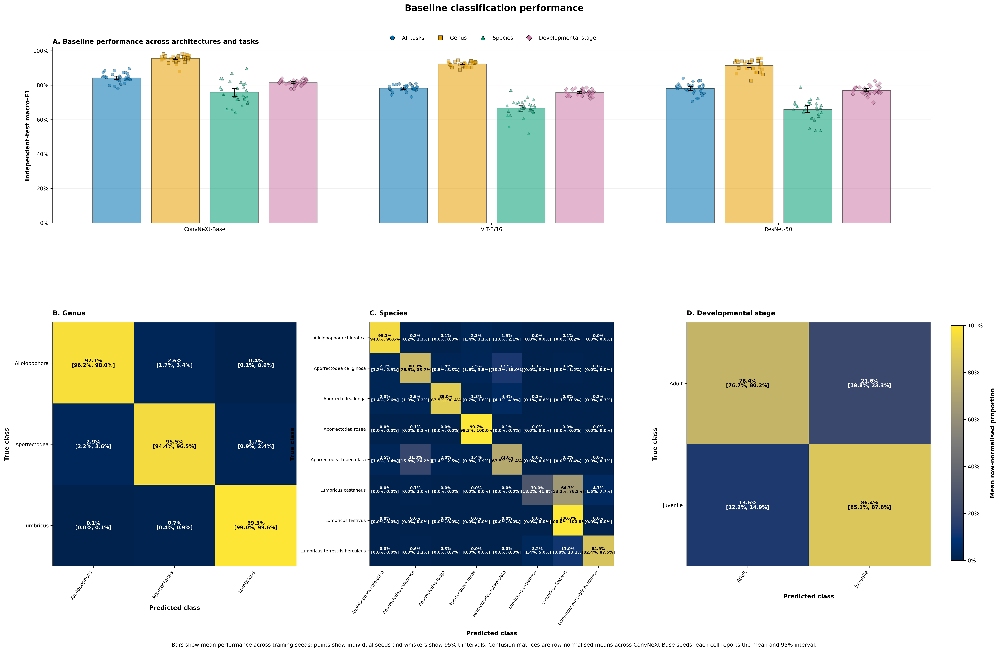

In [39]:
show_figure('figure_01_all_models_all_tasks_clean')

## Figure 1b — developmental-stage performance by genus, species and life stage

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [40]:
# FIGURE 1b — developmental-stage performance for ALL available
# species × developmental-stage combinations
# n = number of unique biological individuals (barcodes) in the test cohort

# =========================================================================
# LOAD FIXED INDEPENDENT TEST SPLIT
# =========================================================================

test_frame = load_split_frames(PROJECT_ROOT).get(
    "test",
    pd.DataFrame(),
)

convnext_runs = (
    baseline_frame[
        baseline_frame["model"].eq(VISUAL_MODEL)
    ][["run_dir", "seed"]]
    .drop_duplicates()
)

rows = []

if test_frame.empty:

    print("Figure 1b: independent test split not found.")

else:

    required_test_columns = {
        "filename",
        "genus",
        "species_label",
        "life_stage",
        "barcode",
    }

    missing = required_test_columns.difference(test_frame.columns)

    if missing:
        raise ValueError(
            "Figure 1b requires these test-split columns: "
            + ", ".join(sorted(missing))
        )


    # =========================================================================
    # BIOLOGICAL SAMPLE SIZE FOR EACH SPECIES × STAGE COHORT
    # =========================================================================

    cohort_counts = (
        test_frame
        .groupby(
            [
                "genus",
                "species_label",
                "life_stage",
            ],
            dropna=False,
        )
        .agg(
            test_individuals=("barcode", "nunique"),
            test_images=("filename", "size"),
        )
        .reset_index()
    )


    # =========================================================================
    # CALCULATE DEVELOPMENTAL-STAGE ACCURACY FOR EACH TRAINING SEED
    # =========================================================================

    for run in convnext_runs.itertuples(index=False):

        prediction_path = (
            Path(run.run_dir)
            / "test_predictions_best.csv"
        )

        if not prediction_path.is_file():
            continue

        predictions = pd.read_csv(
            prediction_path
        )

        required_prediction_columns = {
            "filename",
            "task",
            "true_label",
            "predicted_label",
        }

        if not required_prediction_columns.issubset(
            predictions.columns
        ):
            continue


        # ---------------------------------------------------------------------
        # Developmental-stage task only
        # ---------------------------------------------------------------------

        age_predictions = predictions[
            predictions["task"].eq("age")
        ].copy()

        if age_predictions.empty:
            continue


        # ---------------------------------------------------------------------
        # Attach biological metadata from the fixed test set
        # ---------------------------------------------------------------------

        joined = age_predictions.merge(
            test_frame[
                [
                    "filename",
                    "genus",
                    "species_label",
                    "life_stage",
                ]
            ],
            on="filename",
            how="inner",
            validate="many_to_one",
        )

        if joined.empty:
            continue


        # ---------------------------------------------------------------------
        # Image-level developmental-stage correctness
        # ---------------------------------------------------------------------

        joined["correct"] = (
            joined["true_label"].astype(str)
            == joined["predicted_label"].astype(str)
        ).astype(float)


        # ---------------------------------------------------------------------
        # One observation per:
        # training seed × species × true developmental stage
        # ---------------------------------------------------------------------

        seed_scores = (
            joined
            .groupby(
                [
                    "genus",
                    "species_label",
                    "life_stage",
                ],
                dropna=False,
            )
            .agg(
                score=("correct", "mean"),
                evaluated_images=("correct", "size"),
            )
            .reset_index()
        )

        seed_scores["seed"] = run.seed

        rows.append(seed_scores)


# =========================================================================
# COMBINE ALL TRAINING SEEDS
# =========================================================================

species_stage_performance = (
    pd.concat(
        rows,
        ignore_index=True,
    )
    if rows
    else pd.DataFrame()
)


# =========================================================================
# ATTACH UNIQUE-INDIVIDUAL COUNTS
# =========================================================================

if (
    not species_stage_performance.empty
    and not test_frame.empty
):

    species_stage_performance = (
        species_stage_performance
        .merge(
            cohort_counts,
            on=[
                "genus",
                "species_label",
                "life_stage",
            ],
            how="left",
            validate="many_to_one",
        )
    )


# =========================================================================
# PLOT ALL AVAILABLE SPECIES × STAGE COMBINATIONS
# =========================================================================

if species_stage_performance.empty:

    print(
        "Figure 1b: no species × developmental-stage "
        "performance rows available."
    )

else:

    # =========================================================================
    # CLEAN DISPLAY LABELS
    # =========================================================================

    species_stage_performance["species_display"] = (
        species_stage_performance[
            "species_label"
        ]
        .astype(str)
        .map(clean_label)
    )

    species_stage_performance["stage_display"] = (
        species_stage_performance[
            "life_stage"
        ]
        .astype(str)
        .map(clean_label)
    )


    # -------------------------------------------------------------------------
    # Label each species × stage cohort and explicitly show biological n
    # -------------------------------------------------------------------------

    species_stage_performance["combination"] = (
        species_stage_performance["species_display"]
        + " — "
        + species_stage_performance["stage_display"]
        + "  (n = "
        + species_stage_performance[
            "test_individuals"
        ]
        .fillna(0)
        .astype(int)
        .astype(str)
        + ")"
    )


    # =========================================================================
    # SUMMARY ACROSS TRAINING SEEDS
    # =========================================================================

    summary = seed_summary(
        species_stage_performance,
        [
            "genus",
            "species_label",
            "species_display",
            "life_stage",
            "stage_display",
            "test_individuals",
            "test_images",
            "combination",
        ],
        "score",
    )


    # =========================================================================
    # ORDER:
    # genus → species → Adult → Juvenile
    # =========================================================================

    stage_order = {
        "Adult": 0,
        "Juvenile": 1,
    }

    order_frame = (
        species_stage_performance[
            [
                "genus",
                "species_label",
                "species_display",
                "stage_display",
                "test_individuals",
                "combination",
            ]
        ]
        .drop_duplicates()
        .copy()
    )

    order_frame["stage_order"] = (
        order_frame["stage_display"]
        .map(stage_order)
        .fillna(99)
    )

    order_frame = order_frame.sort_values(
        [
            "genus",
            "species_display",
            "stage_order",
        ]
    )

    combination_order = (
        order_frame["combination"]
        .drop_duplicates()
        .tolist()
    )


    # =========================================================================
    # DYNAMIC FIGURE SIZE
    # =========================================================================

    y = np.arange(
        len(combination_order),
        dtype=float,
    )

    figure_height = max(
        8.0,
        0.62 * len(combination_order) + 2.8,
    )

    fig, ax = plt.subplots(
        figsize=(
            14.5,
            figure_height,
        )
    )


    # =========================================================================
    # COLOUR-BLIND-SAFE STAGE CODING
    # =========================================================================

    stage_colours = {
        "Adult": CB_BLUE,
        "Juvenile": CB_ORANGE,
    }

    stage_markers = {
        "Adult": "o",
        "Juvenile": "s",
    }


    # =========================================================================
    # DRAW EVERY AVAILABLE SPECIES × STAGE COMBINATION
    # =========================================================================

    for combo_index, combination in enumerate(
        combination_order
    ):

        raw = species_stage_performance[
            species_stage_performance[
                "combination"
            ].eq(combination)
        ]

        current_summary = summary[
            summary[
                "combination"
            ].eq(combination)
        ]

        if raw.empty or current_summary.empty:
            continue

        row = current_summary.iloc[0]

        stage = str(
            raw.iloc[0]["stage_display"]
        )

        colour = stage_colours.get(
            stage,
            CB_GREY,
        )

        marker = stage_markers.get(
            stage,
            "D",
        )


        # ---------------------------------------------------------------------
        # Seed-level jitter
        # ---------------------------------------------------------------------

        jitter = _seed_jitter(
            raw["seed"],
            width=0.12,
        )

        ax.scatter(
            raw["score"],
            np.full(
                len(raw),
                y[combo_index],
            )
            + jitter,
            s=30,
            alpha=0.35,
            marker=marker,
            color=colour,
            edgecolor=CB_BLACK,
            linewidth=0.35,
            zorder=2,
        )


        # ---------------------------------------------------------------------
        # Across-seed mean + 95% CI
        # ---------------------------------------------------------------------

        mean = float(
            row["mean"]
        )

        ci95 = (
            0.0
            if pd.isna(row["ci95"])
            else float(row["ci95"])
        )

        ax.errorbar(
            mean,
            y[combo_index],
            xerr=ci95,
            fmt=marker,
            markersize=8,
            color=colour,
            markeredgecolor=CB_BLACK,
            markeredgewidth=0.8,
            elinewidth=1.5,
            capsize=4,
            capthick=1.3,
            zorder=4,
        )


    # =========================================================================
    # SPECIES SEPARATORS
    # =========================================================================

    previous_species = None

    for index, combination in enumerate(
        combination_order
    ):

        current_row = (
            order_frame[
                order_frame[
                    "combination"
                ].eq(combination)
            ]
            .iloc[0]
        )

        species = str(
            current_row[
                "species_display"
            ]
        )

        if (
            previous_species is not None
            and species != previous_species
        ):

            ax.axhline(
                index - 0.5,
                color=CB_GREY,
                linewidth=0.7,
                alpha=0.35,
                zorder=0,
            )

        previous_species = species


    # =========================================================================
    # AXIS FORMATTING
    # =========================================================================

    ax.set_yticks(
        y,
        combination_order,
    )

    ax.set_ylim(
        len(combination_order) - 0.5,
        -0.5,
    )

    ax.set_xlim(
        0,
        1.02,
    )

    ax.xaxis.set_major_formatter(
        PercentFormatter(1.0)
    )

    ax.set_xlabel(
        "Developmental-stage classification accuracy",
        fontweight="bold",
    )

    ax.set_ylabel(
        "Species × true developmental stage\n"
        "(n = unique test individuals)",
        fontweight="bold",
    )

    ax.set_title(
        "Developmental-stage performance across all species–stage combinations",
        loc="left",
        fontweight="bold",
    )

    _style_axis(
        ax,
        grid_axis="x",
    )


    # =========================================================================
    # LEGEND
    # =========================================================================

    from matplotlib.lines import Line2D

    legend_handles = [
        Line2D(
            [0],
            [0],
            marker="o",
            linestyle="none",
            markerfacecolor=CB_BLUE,
            markeredgecolor=CB_BLACK,
            markeredgewidth=0.6,
            markersize=7,
            label="Adult",
        ),

        Line2D(
            [0],
            [0],
            marker="s",
            linestyle="none",
            markerfacecolor=CB_ORANGE,
            markeredgecolor=CB_BLACK,
            markeredgewidth=0.6,
            markersize=7,
            label="Juvenile",
        ),
    ]

    ax.legend(
        handles=legend_handles,
        title="True developmental stage",
        frameon=False,
        loc="lower right",
    )


    # =========================================================================
    # FIGURE NOTE
    # =========================================================================

    fig.text(
        0.5,
        0.012,
        "Each row represents one observed species × developmental-stage cohort. "
        "n is the number of unique biological individuals (barcodes) in the "
        "independent test set. Small points represent individual training seeds; "
        "large markers and whiskers show the across-seed mean and 95% t interval. "
        "Accuracy is calculated at image level.",
        ha="center",
        fontsize=9,
    )


    # More left margin for species names + n
    fig.subplots_adjust(
        left=0.34,
        right=0.97,
        top=0.95,
        bottom=0.09,
    )


    # =========================================================================
    # SAVE
    # =========================================================================

    _save_inline(
        fig,
        "figure_01b_all_species_stage_performance",
        {
            "seed_level_species_stage":
                species_stage_performance,

            "seed_summary":
                summary,

            "test_cohort_counts":
                cohort_counts,
        },
        {
            "model":
                VISUAL_MODEL,

            "task":
                "developmental stage",

            "split":
                "independent test",

            "evaluation_unit":
                "image",

            "biological_sample_unit":
                "unique barcode",

            "grouping":
                "all observed species × true developmental-stage combinations",

            "displayed_n":
                "unique biological individuals in each independent-test cohort",

            "uncertainty":
                "95% t interval across training seeds",

            **_paper_design_manifest(),
        },
    )

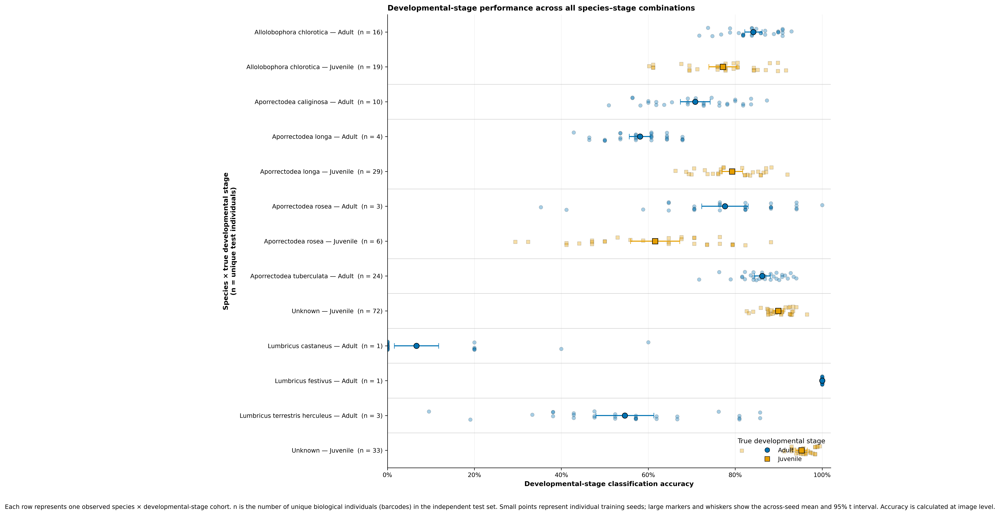

In [41]:
show_figure('figure_01b_all_species_stage_performance')

## Figure 2 — visual ablations (linear resolution axis)

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [8]:

# FIGURE 2 — visual ablations (linear resolution axis)
frames = visual_frames
if not frames:
    print("Figure 2: no completed visual-ablation runs.")
else:
    fig = plt.figure(figsize=(16.5, 11.2))
    grid = fig.add_gridspec(2, 2, hspace=0.40, wspace=0.28)
    axes = {
        "gaussian": fig.add_subplot(grid[0, 0]),
        "resolution": fig.add_subplot(grid[0, 1]),
        "colour": fig.add_subplot(grid[1, 0]),
        "patch": fig.add_subplot(grid[1, 1]),
    }
    summaries = []
    specs = (
        ("gaussian", "A. Gaussian blur", "Gaussian blur severity (%)"),
        ("resolution", "B. Spatial resolution retained", "Intermediate image side (pixels)"),
        ("colour", "C. Colour and silhouette", "Visual information retained"),
        ("patch", "D. Patch shuffling", "Patch grid"),
    )
    for panel, title, xlabel in specs:
        current = frames[panel].copy()
        summary = seed_summary(current, ["level"], "test_mean_macro_f1")
        summaries.append(summary.assign(panel=panel))
        xvals = summary["level"].to_numpy(dtype=float)
        ax = axes[panel]
        ax.plot(xvals, summary["mean"], color=CB_BLUE, linewidth=2.0, zorder=2)
        ax.errorbar(
            xvals, summary["mean"], yerr=summary["ci95"].fillna(0.0),
            fmt="o", color=CB_BLUE, markerfacecolor="white", markeredgewidth=1.2,
            capsize=3, markersize=6, zorder=4,
        )
        unique_x = np.sort(pd.to_numeric(current["level"], errors="coerce").dropna().unique())
        steps = np.diff(unique_x)
        jitter_width = float(steps[steps > 0].min()) * 0.07 if np.any(steps > 0) else 0.08
        ax.scatter(
            pd.to_numeric(current["level"], errors="coerce") + _seed_jitter(current.get("seed", current.index), width=jitter_width),
            current["test_mean_macro_f1"],
            s=18, alpha=0.24, color=CB_BLUE, zorder=3,
        )
        chance = pd.to_numeric(current.get("chance", np.nan), errors="coerce")
        if np.ndim(chance) and pd.Series(chance).notna().any():
            chance_value = float(pd.Series(chance).dropna().mean())
            ax.axhline(chance_value, color=CB_GREY, linestyle=(0, (4, 2)), linewidth=1.0)
            ax.text(0.99, chance_value, f"Uniform chance {chance_value:.1%}", transform=ax.get_yaxis_transform(), ha="right", va="bottom", fontsize=7.5)
        ax.set_title(title, loc="left", fontweight="bold")
        ax.set_xlabel(xlabel)
        ax.set_ylabel("Independent-test mean macro-F1")
        ax.set_ylim(0, 1.02)
        ax.yaxis.set_major_formatter(PercentFormatter(1.0))
        _style_axis(ax, grid_axis="y")

    axes["colour"].set_xticks([0, 1, 2], ["Binary silhouette", "Greyscale", "Original RGB"])
    patch_ticks = sorted(frames["patch"]["level"].dropna().unique())
    axes["patch"].set_xticks(patch_ticks, [f"{int(v)}×{int(v)}" for v in patch_ticks])
    if "linear" == "log2":
        axes["resolution"].set_xscale("log", base=2)
    axes["resolution"].invert_xaxis()
    axes["resolution"].xaxis.set_major_formatter(matplotlib.ticker.ScalarFormatter())
    axes["resolution"].set_xticks(sorted(frames["resolution"]["level"].dropna().unique(), reverse=True))

    fig.suptitle(f"Visual ablations — {_display_model(VISUAL_MODEL)}", fontweight="bold", y=0.995)
    fig.text(0.5, 0.012, "Small points are training seeds; open circles and whiskers are seed means and 95% t intervals.", ha="center", fontsize=9)
    fig.subplots_adjust(top=0.94, bottom=0.08, left=0.08, right=0.98)
    plot_data = pd.concat([f.assign(panel=p) for p, f in frames.items() if p != "interaction"], ignore_index=True)
    _save_inline(
        fig, "figure_02_convnext_visual_ablation_clean",
        {"plot_data": plot_data, "seed_summary": pd.concat(summaries, ignore_index=True), "chance_reference": chance_reference},
        {"model": VISUAL_MODEL, "split": "independent test", "resolution_scale": "linear", **_paper_design_manifest()},
    )


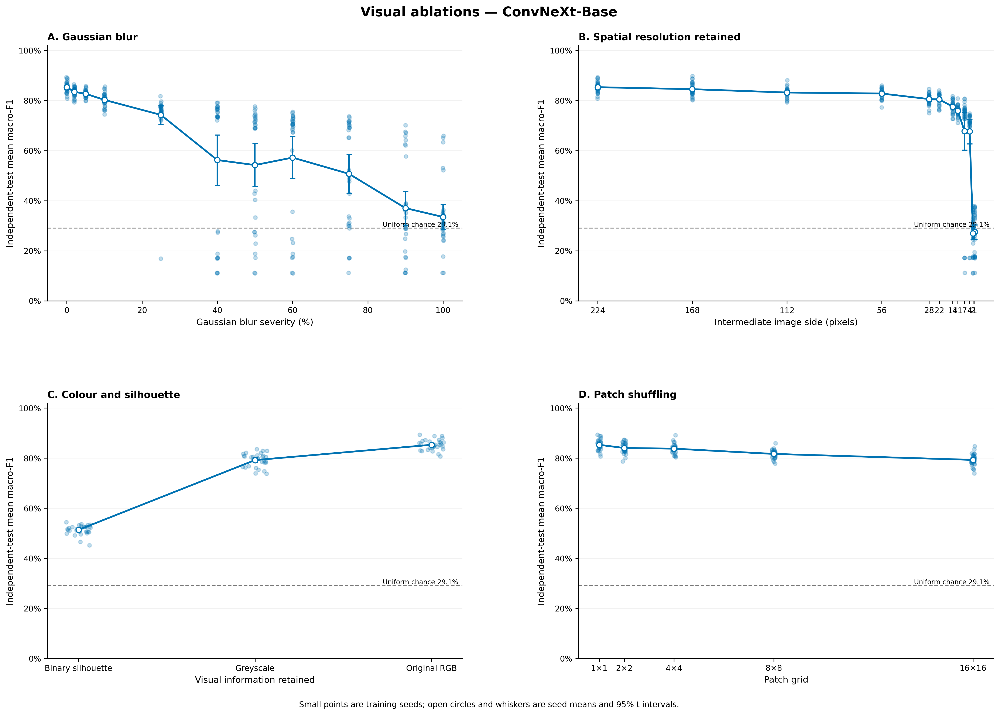

In [9]:
show_figure('figure_02_convnext_visual_ablation_clean')

## Figure 2b — visual ablations (log₂ resolution axis)

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [10]:

# FIGURE 2b — visual ablations (log₂ resolution axis)
frames = visual_frames
if not frames:
    print("Figure 2b: no completed visual-ablation runs.")
else:
    fig = plt.figure(figsize=(16.5, 11.2))
    grid = fig.add_gridspec(2, 2, hspace=0.40, wspace=0.28)
    axes = {
        "gaussian": fig.add_subplot(grid[0, 0]),
        "resolution": fig.add_subplot(grid[0, 1]),
        "colour": fig.add_subplot(grid[1, 0]),
        "patch": fig.add_subplot(grid[1, 1]),
    }
    summaries = []
    specs = (
        ("gaussian", "A. Gaussian blur", "Gaussian blur severity (%)"),
        ("resolution", "B. Spatial resolution retained", "Intermediate image side (pixels)"),
        ("colour", "C. Colour and silhouette", "Visual information retained"),
        ("patch", "D. Patch shuffling", "Patch grid"),
    )
    for panel, title, xlabel in specs:
        current = frames[panel].copy()
        summary = seed_summary(current, ["level"], "test_mean_macro_f1")
        summaries.append(summary.assign(panel=panel))
        xvals = summary["level"].to_numpy(dtype=float)
        ax = axes[panel]
        ax.plot(xvals, summary["mean"], color=CB_BLUE, linewidth=2.0, zorder=2)
        ax.errorbar(
            xvals, summary["mean"], yerr=summary["ci95"].fillna(0.0),
            fmt="o", color=CB_BLUE, markerfacecolor="white", markeredgewidth=1.2,
            capsize=3, markersize=6, zorder=4,
        )
        unique_x = np.sort(pd.to_numeric(current["level"], errors="coerce").dropna().unique())
        steps = np.diff(unique_x)
        jitter_width = float(steps[steps > 0].min()) * 0.07 if np.any(steps > 0) else 0.08
        ax.scatter(
            pd.to_numeric(current["level"], errors="coerce") + _seed_jitter(current.get("seed", current.index), width=jitter_width),
            current["test_mean_macro_f1"],
            s=18, alpha=0.24, color=CB_BLUE, zorder=3,
        )
        chance = pd.to_numeric(current.get("chance", np.nan), errors="coerce")
        if np.ndim(chance) and pd.Series(chance).notna().any():
            chance_value = float(pd.Series(chance).dropna().mean())
            ax.axhline(chance_value, color=CB_GREY, linestyle=(0, (4, 2)), linewidth=1.0)
            ax.text(0.99, chance_value, f"Uniform chance {chance_value:.1%}", transform=ax.get_yaxis_transform(), ha="right", va="bottom", fontsize=7.5)
        ax.set_title(title, loc="left", fontweight="bold")
        ax.set_xlabel(xlabel)
        ax.set_ylabel("Independent-test mean macro-F1")
        ax.set_ylim(0, 1.02)
        ax.yaxis.set_major_formatter(PercentFormatter(1.0))
        _style_axis(ax, grid_axis="y")

    axes["colour"].set_xticks([0, 1, 2], ["Binary silhouette", "Greyscale", "Original RGB"])
    patch_ticks = sorted(frames["patch"]["level"].dropna().unique())
    axes["patch"].set_xticks(patch_ticks, [f"{int(v)}×{int(v)}" for v in patch_ticks])
    if "log2" == "log2":
        axes["resolution"].set_xscale("log", base=2)
    axes["resolution"].invert_xaxis()
    axes["resolution"].xaxis.set_major_formatter(matplotlib.ticker.ScalarFormatter())
    axes["resolution"].set_xticks(sorted(frames["resolution"]["level"].dropna().unique(), reverse=True))

    fig.suptitle(f"Visual ablations — {_display_model(VISUAL_MODEL)}", fontweight="bold", y=0.995)
    fig.text(0.5, 0.012, "Small points are training seeds; open circles and whiskers are seed means and 95% t intervals.", ha="center", fontsize=9)
    fig.subplots_adjust(top=0.94, bottom=0.08, left=0.08, right=0.98)
    plot_data = pd.concat([f.assign(panel=p) for p, f in frames.items() if p != "interaction"], ignore_index=True)
    _save_inline(
        fig, "figure_02b_convnext_visual_ablation_resolution_log2_clean",
        {"plot_data": plot_data, "seed_summary": pd.concat(summaries, ignore_index=True), "chance_reference": chance_reference},
        {"model": VISUAL_MODEL, "split": "independent test", "resolution_scale": "log2", **_paper_design_manifest()},
    )


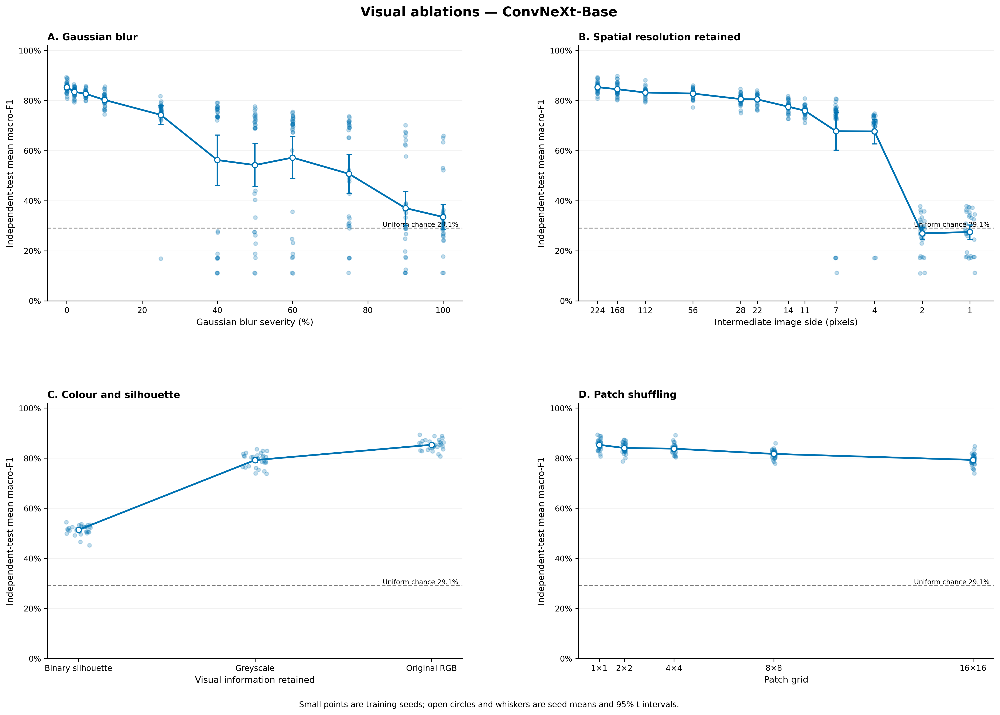

In [11]:
show_figure('figure_02b_convnext_visual_ablation_resolution_log2_clean')

## Figure 2c — mixed visual ablations

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [12]:

# FIGURE 2c — mixed visual ablations with paired seed traces
frame = visual_frames.get("interaction", pd.DataFrame()).copy()
if frame.empty:
    print("Figure 2c: no completed mixed visual-ablation runs.")
else:
    order = [
        "100% colour (Gaussian only)", "0% colour", "2×2 patches",
        "4×4 patches", "8×8 patches", "16×16 patches",
    ]
    observed = [value for value in order if value in set(frame["series"])]
    blur_levels = sorted(pd.to_numeric(frame["level"], errors="coerce").dropna().unique())
    summary = seed_summary(frame, ["level", "series"], "test_mean_macro_f1")
    fig, axes = plt.subplots(1, len(blur_levels), figsize=(max(15, 4.0 * len(blur_levels)), 7.0), sharey=True, squeeze=False)
    series_colours = [CB_BLUE, CB_ORANGE, CB_GREEN, CB_PURPLE, CB_SKY, CB_VERMILLION]
    series_markers = ["o", "s", "^", "v", "D", "P"]
    for level_index, level in enumerate(blur_levels):
        ax = axes[0, level_index]
        current = frame[pd.to_numeric(frame["level"], errors="coerce").eq(level)]
        x = np.arange(len(observed), dtype=float)
        for seed, seed_frame in current.groupby("seed", dropna=False):
            seed_frame = seed_frame.set_index("series")
            present = [value for value in observed if value in seed_frame.index]
            if len(present) >= 2:
                xs = [observed.index(value) for value in present]
                ys = [float(seed_frame.loc[value]["test_mean_macro_f1"]) for value in present]
                ax.plot(xs, ys, color=CB_GREY, linewidth=0.5, alpha=0.13, zorder=1)
        for i, series in enumerate(observed):
            raw = current[current["series"].eq(series)]
            ax.scatter(
                np.full(len(raw), x[i]) + _seed_jitter(raw.get("seed", raw.index), width=0.09),
                raw["test_mean_macro_f1"], s=20, alpha=0.30,
                color=series_colours[i], marker=series_markers[i], zorder=2,
            )
            row = summary[pd.to_numeric(summary["level"], errors="coerce").eq(level) & summary["series"].eq(series)]
            if not row.empty:
                row = row.iloc[0]
                ax.errorbar(x[i], row["mean"], yerr=0.0 if pd.isna(row["ci95"]) else row["ci95"], fmt=series_markers[i], color=series_colours[i], markeredgecolor=CB_BLACK, markeredgewidth=0.7, capsize=3, markersize=7, zorder=4)
        ax.set_title(f"Gaussian blur {level:g}%", fontweight="bold")
        ax.set_xticks(x, [clean_label(v) for v in observed], rotation=58, ha="right")
        ax.set_ylim(0, 1.02)
        ax.yaxis.set_major_formatter(PercentFormatter(1.0))
        _style_axis(ax, grid_axis="y")
        if level_index == 0:
            ax.set_ylabel("Independent-test mean macro-F1")
    fig.suptitle(f"Mixed visual ablations — {_display_model(VISUAL_MODEL)}", fontweight="bold")
    fig.text(0.5, 0.015, "Thin grey lines connect the same training seed across cue conditions. Coloured points are individual seeds; outlined markers and whiskers are means and 95% t intervals.", ha="center", fontsize=9)
    fig.subplots_adjust(top=0.88, bottom=0.33, left=0.06, right=0.995, wspace=0.16)
    _save_inline(fig, "figure_02c_mixed_visual_seed_comparison_clean", {"plot_data": frame, "seed_summary": summary}, {"model": VISUAL_MODEL, "split": "independent test", "pairing_unit": "training seed", **_paper_design_manifest()})


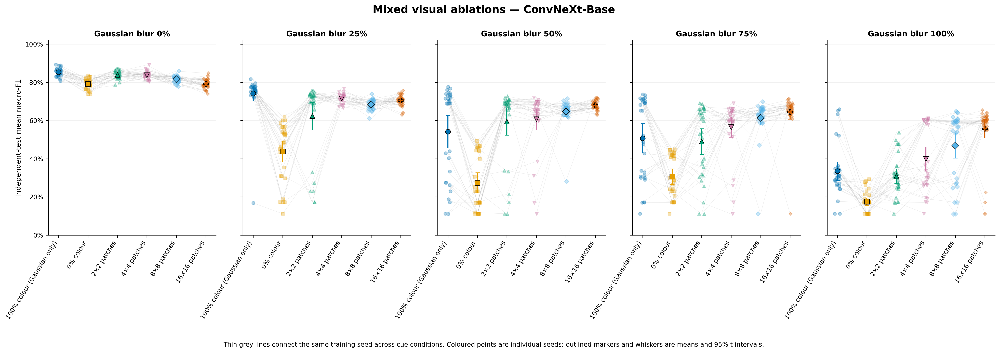

In [13]:
show_figure('figure_02c_mixed_visual_seed_comparison_clean')

## Figure 3 — selected species ablation

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [14]:

# FIGURE 3 — selected species ablation, standardised shared-variance view + jitter
frame = species_paired.copy()
if frame.empty:
    print("Figure 3: no paired rows for selected species.")
else:
    effect = shared_variance_effect_summary(frame, identity_columns=_individual_count_identity_columns("stage"))
    stages = _ordered_stages(effect["stage"].dropna().unique())
    y = np.arange(len(stages), dtype=float)
    fig, axes = plt.subplots(1, 3, figsize=(19.5, 6.8), sharey=True, squeeze=False)
    jitter_rows = []
    for task_index, task in enumerate(TASK_ORDER):
        ax = axes[0, task_index]
        current = effect[effect["task"].eq(task)].set_index("stage")
        for i, stage in enumerate(stages):
            if stage not in current.index:
                continue
            row = current.loc[stage]
            if isinstance(row, pd.DataFrame): row = row.iloc[0]
            seed_pos = standardised_seed_positions(frame[frame["task"].eq(task)], identity={"stage": stage}, shared_sd=float(row["shared_normal_sd"]))
            if not seed_pos.empty:
                jit = _seed_jitter(seed_pos["seed"], width=0.085)
                ax.scatter(seed_pos["retained"], np.full(len(seed_pos), y[i]) + jit, s=16, alpha=0.22, color=CB_ORANGE, marker="o", zorder=1)
                ax.scatter(seed_pos["total"], np.full(len(seed_pos), y[i]) + jit, s=16, alpha=0.22, color=CB_BLUE, marker="D", zorder=1)
                for rec in seed_pos.to_dict("records"):
                    jitter_rows.append({"task": task, "stage": stage, **rec})
            _draw_capacity_row(ax, row, y[i], annotate=True)
        _configure_capacity_axis(ax)
        ax.set_title(TASK_LABELS[task], loc="left", fontweight="bold")
        ax.set_yticks(y)
        if task_index == 0:
            labels = []
            for stage in stages:
                rows = effect[effect["stage"].eq(stage)]
                labels.append(_cohort_count_label(stage, rows.iloc[0]) if not rows.empty else stage)
            ax.set_yticklabels(labels)
            ax.set_ylabel("Life stage")
        else:
            ax.tick_params(axis="y", labelleft=False)
    axes[0,0].set_ylim(len(stages)-0.5, -0.5)
    fig.suptitle(f"Species-stage ablation: {clean_taxon(SPECIES_ABLATION)}", fontweight="bold", y=0.995)
    fig.text(0.5, 0.015, "Faint points are matched training seeds. Orange circles show retained performance after ablation; blue diamonds show full-data performance. Thick segments decompose total performance into retained and lost components; whiskers are paired-seed bootstrap intervals.", ha="center", fontsize=9)
    fig.subplots_adjust(top=0.84, bottom=0.16, left=0.12, right=0.98, wspace=0.15)
    _save_inline(fig, "figure_03_species_ablation_clean", {"recall_seed_data": _recall_seed_data(frame), "shared_variance_effects": effect, "jitter_positions": pd.DataFrame(jitter_rows)}, {"species_ablation": SPECIES_ABLATION, "model": TAXON_MODEL, **_ablation_interval_details(), **_paper_design_manifest()})


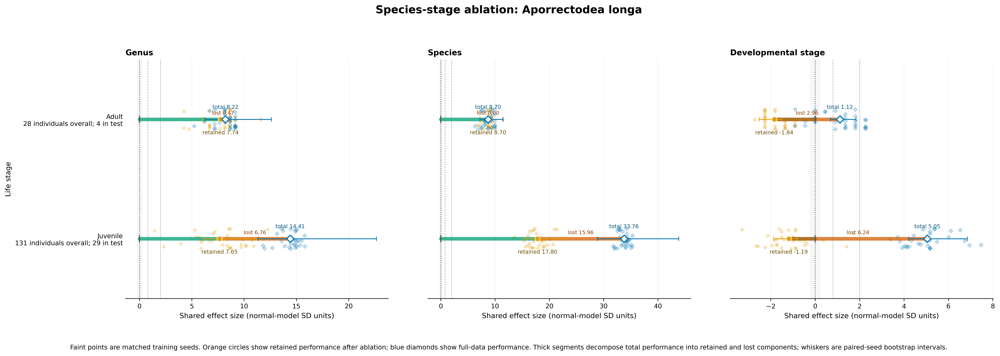

In [15]:
show_figure('figure_03_species_ablation_clean')

## Figure 3b — target precision, recall and F1

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [16]:

# FIGURE 3b — precision, recall and F1 with seed jitter
paired_local = species_paired.copy()
metric_specs = (("target_precision", "Precision"), ("target_recall", "Recall"), ("target_f1", "F1"))
available = [(metric, label) for metric, label in metric_specs if f"baseline_{metric}" in paired_local and f"ablated_{metric}" in paired_local]
if paired_local.empty or not available:
    print("Figure 3b: target-class metrics are unavailable.")
else:
    rows = []
    for metric, label in available:
        for system, prefix in (("Full-data baseline", "baseline"), ("Ablated training", "ablated")):
            current = paired_local[[c for c in ("seed", "stage", "task") if c in paired_local]].copy()
            current["metric"] = label
            current["system"] = system
            current["score"] = pd.to_numeric(paired_local[f"{prefix}_{metric}"], errors="coerce")
            rows.append(current)
    plot_data = pd.concat(rows, ignore_index=True).dropna(subset=["score"])
    summary = seed_summary(plot_data, ["stage", "task", "metric", "system"], "score")
    stages = _ordered_stages(plot_data["stage"].dropna().unique())
    fig, axes = plt.subplots(len(stages), len(TASK_ORDER), figsize=(18.5, max(6.5, 5.2 * len(stages))), sharex=True, sharey=True, squeeze=False)
    x = np.arange(len(available), dtype=float)
    offsets = {"Full-data baseline": -0.14, "Ablated training": 0.14}
    for stage_i, stage in enumerate(stages):
        for task_i, task in enumerate(TASK_ORDER):
            ax = axes[stage_i, task_i]
            current = plot_data[plot_data["stage"].eq(stage) & plot_data["task"].eq(task)]
            current_summary = summary[summary["stage"].eq(stage) & summary["task"].eq(task)]
            for metric_i, (_, metric_label) in enumerate(available):
                for system in offsets:
                    raw = current[current["metric"].eq(metric_label) & current["system"].eq(system)]
                    xpos = x[metric_i] + offsets[system]
                    ax.scatter(np.full(len(raw), xpos) + _seed_jitter(raw.get("seed", raw.index), width=0.045), raw["score"], s=18, alpha=0.24, marker=SYSTEM_MARKERS[system], color=SYSTEM_COLOURS[system])
                    row = current_summary[current_summary["metric"].eq(metric_label) & current_summary["system"].eq(system)]
                    if not row.empty:
                        row = row.iloc[0]
                        ax.errorbar(xpos, row["mean"], yerr=0.0 if pd.isna(row["ci95"]) else row["ci95"], fmt=SYSTEM_MARKERS[system], color=SYSTEM_COLOURS[system], markeredgecolor=CB_BLACK, markeredgewidth=0.7, capsize=3, markersize=7, label=system if stage_i == task_i == metric_i == 0 else None)
            ax.set_xticks(x, [label for _, label in available])
            ax.set_ylim(0, 1.02)
            ax.yaxis.set_major_formatter(PercentFormatter(1.0))
            _style_axis(ax, grid_axis="y")
            if stage_i == 0: ax.set_title(TASK_LABELS[task], fontweight="bold")
            if task_i == 0: ax.set_ylabel(f"{stage}\nIndependent-test score")
    handles = [
        matplotlib.lines.Line2D([0],[0], marker=SYSTEM_MARKERS[s], color=SYSTEM_COLOURS[s], linestyle="none", label=s)
        for s in offsets
    ]
    fig.legend(handles=handles, loc="upper center", bbox_to_anchor=(0.5,0.945), ncol=2, frameon=False)
    fig.suptitle(f"Target-class metrics after withholding {clean_taxon(SPECIES_ABLATION)}", fontweight="bold", y=0.995)
    fig.text(0.5,0.012,"Points are matched training seeds; outlined markers and whiskers are seed means and 95% t intervals. Precision is one-vs-rest on the complete independent test split.",ha="center",fontsize=9)
    fig.subplots_adjust(top=0.89,bottom=0.08,left=0.09,right=0.985,hspace=0.25,wspace=0.16)
    _save_inline(fig,"figure_03b_species_ablation_precision_recall_f1_clean",{"plot_data":plot_data,"seed_summary":summary},{"species_ablation":SPECIES_ABLATION,"split":"independent test",**_paper_design_manifest()})


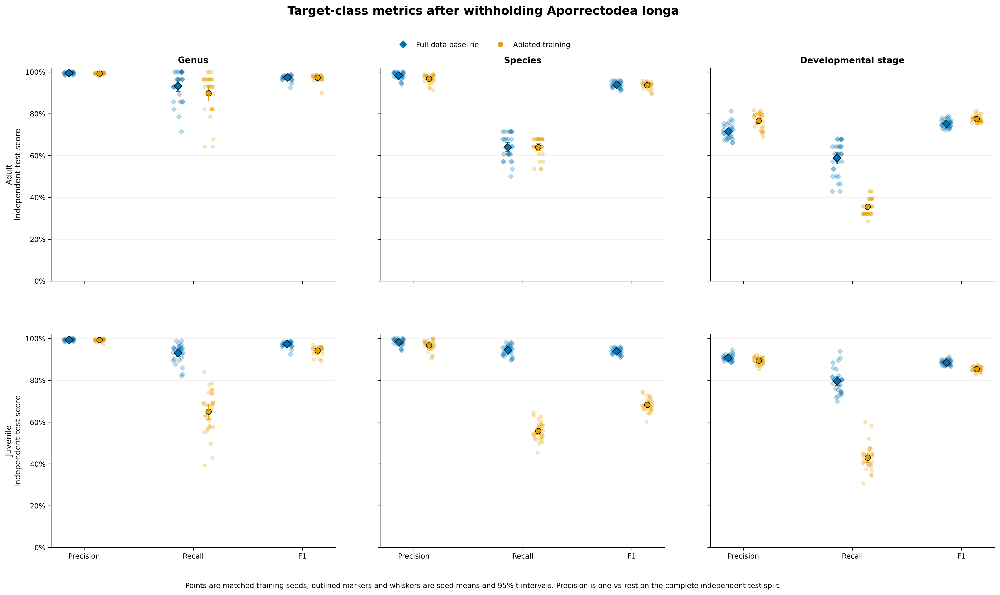

In [17]:
show_figure('figure_03b_species_ablation_precision_recall_f1_clean')

## Figure 4 — biological transfer questions

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [18]:

# FIGURE 4 — biological transfer questions, all with seed jitter
frame = biological_questions.copy()
if frame.empty:
    print("Figure 4: prediction-derived transfer data are unavailable.")
else:
    question_order = ["Direct withheld cohort", "Adult removed → evaluate Juvenile", "Juvenile removed → evaluate Adult", "Within-genus spillover"]
    questions = [q for q in question_order if q in set(frame["question"])]
    per_seed = frame.groupby(["question", "task", "seed"], dropna=False, as_index=False)["delta"].mean()
    summary = seed_summary(per_seed, ["question", "task"], "delta")
    fig, axes = plt.subplots(2, 2, figsize=(16.5, 10.8), sharex=True, sharey=True, squeeze=False)
    x = np.arange(len(TASK_ORDER), dtype=float)
    for qi, question in enumerate(questions):
        ax = axes.flat[qi]
        current = per_seed[per_seed["question"].eq(question)]
        current_summary = summary[summary["question"].eq(question)].set_index("task")
        for ti, task in enumerate(TASK_ORDER):
            raw = current[current["task"].eq(task)]
            ax.scatter(np.full(len(raw), x[ti]) + _seed_jitter(raw.get("seed", raw.index), width=0.09), raw["delta"], s=22, alpha=0.28, marker=("o","s","^")[ti], color=TASK_COLOURS[task])
            if task in current_summary.index:
                row = current_summary.loc[task]
                ax.errorbar(x[ti], row["mean"], yerr=0.0 if pd.isna(row["ci95"]) else row["ci95"], fmt=("o","s","^")[ti], color=TASK_COLOURS[task], markeredgecolor=CB_BLACK, markeredgewidth=0.8, capsize=4, markersize=8, zorder=4)
        ax.axhline(0.0, color=CB_GREY, linestyle=":", linewidth=1.1)
        ax.set_xticks(x, [TASK_LABELS[t] for t in TASK_ORDER])
        ax.yaxis.set_major_formatter(PercentFormatter(1.0))
        ax.set_title(f"{chr(65+qi)}. {question}", loc="left", fontweight="bold")
        _style_axis(ax, grid_axis="y")
        if qi % 2 == 0: ax.set_ylabel("Change from matched full-data model")
    for unused in range(len(questions),4): axes.flat[unused].set_axis_off()
    fig.suptitle("Transfer after withholding a species-stage cohort", fontweight="bold")
    fig.text(0.5,0.015,"Each point is a training seed after averaging eligible species within that seed. Negative values indicate worse independent-test cohort accuracy after ablation; outlined markers and whiskers show means and 95% t intervals.",ha="center",fontsize=9)
    fig.subplots_adjust(top=0.92,bottom=0.09,left=0.09,right=0.98,hspace=0.28,wspace=0.17)
    _save_inline(fig,"figure_04_biological_transfer_questions_clean",{"prediction_derived_metrics":frame,"per_seed_species_average":per_seed,"seed_summary":summary},{"split":"independent test only","metric":"change in image-level cohort accuracy",**_paper_design_manifest()})


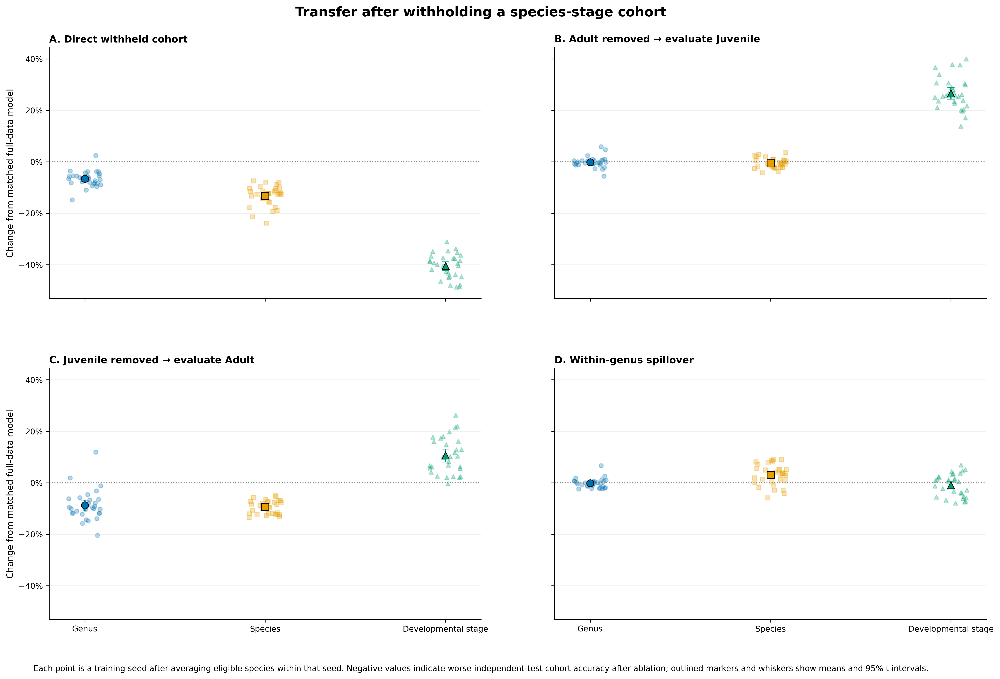

In [19]:
show_figure('figure_04_biological_transfer_questions_clean')

## Figure 5 — raw recall margins for the selected species

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [20]:

# FIGURE 5 — selected species raw recall margins + seed jitter
frame = species_paired.copy()
if frame.empty:
    print("Figure 5: no paired rows for selected species.")
else:
    full_summary = shared_variance_effect_summary(frame, identity_columns=_individual_count_identity_columns("stage"))
    summary = _raw_margin_summary(full_summary)
    stages = _ordered_stages(summary["stage"].dropna().unique())
    y = np.arange(len(stages), dtype=float)
    fig, axes = plt.subplots(1, 3, figsize=(19.5, 6.8), sharey=True, squeeze=False)
    jitter_rows = []
    for task_i, task in enumerate(TASK_ORDER):
        ax = axes[0, task_i]
        current = summary[summary["task"].eq(task)].set_index("stage")
        for i, stage in enumerate(stages):
            if stage not in current.index: continue
            row = current.loc[stage]
            if isinstance(row,pd.DataFrame): row=row.iloc[0]
            seed_pos = raw_margin_seed_positions(frame[frame["task"].eq(task)], identity={"stage":stage})
            if not seed_pos.empty:
                jit = _seed_jitter(seed_pos["seed"], width=0.085)
                ax.scatter(seed_pos["retained"], np.full(len(seed_pos), y[i])+jit, s=16, alpha=0.22, color=CB_ORANGE, marker="o", zorder=1)
                ax.scatter(seed_pos["total"], np.full(len(seed_pos), y[i])+jit, s=16, alpha=0.22, color=CB_BLUE, marker="D", zorder=1)
                for rec in seed_pos.to_dict("records"): jitter_rows.append({"task":task,"stage":stage,**rec})
            _draw_margin_row(ax,row,y[i],annotate=True)
        _configure_margin_axis(ax)
        ax.set_title(TASK_LABELS[task],loc="left",fontweight="bold")
        ax.set_yticks(y)
        if task_i==0:
            labels=[]
            for stage in stages:
                rows=summary[summary["stage"].eq(stage)]
                labels.append(_cohort_count_label(stage,rows.iloc[0]) if not rows.empty else stage)
            ax.set_yticklabels(labels)
            ax.set_ylabel("Life stage")
        else: ax.tick_params(axis="y",labelleft=False)
    axes[0,0].set_ylim(len(stages)-0.5,-0.5)
    fig.suptitle(f"Raw target-recall margins: {clean_taxon(SPECIES_ABLATION)}",fontweight="bold",y=0.995)
    fig.text(0.5,0.015,"Faint points are matched training seeds. Orange circles are retained margins after ablation; blue diamonds are full-data margins. Thick orange-red segments are the margin lost after ablation; whiskers are paired-seed bootstrap intervals.",ha="center",fontsize=9)
    fig.subplots_adjust(top=0.84,bottom=0.16,left=0.12,right=0.98,wspace=0.15)
    _save_inline(fig,"figure_05_species_ablation_raw_margins_clean",{"recall_seed_data":_recall_seed_data(frame),"raw_margin_decomposition":summary,"jitter_positions":pd.DataFrame(jitter_rows)},{"species_ablation":SPECIES_ABLATION,**_raw_margin_details()})


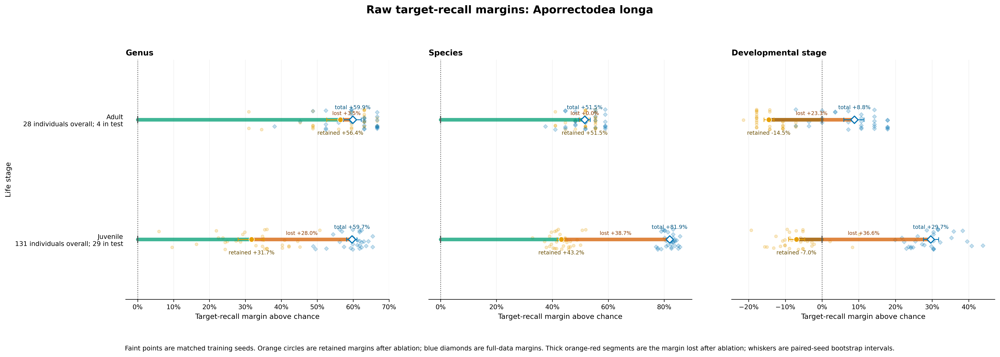

In [21]:
show_figure('figure_05_species_ablation_raw_margins_clean')

## Supplementary Figure 1 — all species-stage standardised effects

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [22]:

# SUPPLEMENTARY FIGURE 1 — all species-stage standardised effects + subtle seed jitter
frame = paired.copy()
if frame.empty or "combo_label" not in frame:
    print("Supplementary Figure 1: no paired species-stage rows.")
else:
    summary = species_effect_summary(frame)
    order_frame = frame[[c for c in ("stage","genus","species","combo_label") if c in frame]].drop_duplicates().sort_values([c for c in ("stage","genus","species") if c in frame])
    combinations = list(dict.fromkeys(order_frame["combo_label"].astype(str).tolist()))
    y = np.arange(len(combinations),dtype=float)
    fig_height=max(10.0,0.70*len(combinations)+3.2)
    fig,axes=plt.subplots(1,3,figsize=(21,fig_height),sharey=True,squeeze=False)
    jitter_rows=[]
    for task_i,task in enumerate(TASK_ORDER):
        ax=axes[0,task_i]
        current=summary[summary["task"].eq(task)].set_index("combo_label")
        for i,combo in enumerate(combinations):
            if combo not in current.index: continue
            row=current.loc[combo]
            if isinstance(row,pd.DataFrame): row=row.iloc[0]
            seed_pos=standardised_seed_positions(frame[frame["task"].eq(task)],identity={"combo_label":combo},shared_sd=float(row["shared_normal_sd"]))
            if not seed_pos.empty:
                jit=_seed_jitter(seed_pos["seed"],width=0.075)
                ax.scatter(seed_pos["retained"],np.full(len(seed_pos),y[i])+jit,s=8,alpha=0.12,color=CB_ORANGE,marker="o",zorder=1)
                ax.scatter(seed_pos["total"],np.full(len(seed_pos),y[i])+jit,s=8,alpha=0.12,color=CB_BLUE,marker="D",zorder=1)
                for rec in seed_pos.to_dict("records"): jitter_rows.append({"task":task,"combo_label":combo,**rec})
            _draw_capacity_row(ax,row,y[i],annotate=False)
        _configure_capacity_axis(ax)
        ax.set_title(TASK_LABELS[task],loc="left",fontweight="bold")
        ax.set_yticks(y)
        if task_i==0:
            labels=[]
            for combo in combinations:
                rows=summary[summary["combo_label"].astype(str).eq(combo)]
                label=clean_taxon(combo)
                labels.append(_cohort_count_label(label,rows.iloc[0]) if not rows.empty else label)
            ax.set_yticklabels(labels,fontsize=7.8)
            ax.set_ylabel("Species-stage holdout")
        else: ax.tick_params(axis="y",labelleft=False)
    axes[0,0].set_ylim(len(combinations)-0.5,-0.5)
    fig.suptitle("Supplementary: recall effects by species and life stage",fontweight="bold",y=0.995)
    fig.text(0.5,0.012,"Faint points are matched training seeds; summary positions use the normal-model seed SD. Orange circles are retained performance and blue diamonds are full-data performance; their gap is the ablation effect.",ha="center",fontsize=9)
    fig.subplots_adjust(top=0.93,bottom=0.06,left=0.23,right=0.98,wspace=0.12)
    _save_inline(fig,"supplementary_figure_01_all_species_effects_clean",{"recall_seed_data":_recall_seed_data(frame),"shared_variance_effects":summary,"jitter_positions":pd.DataFrame(jitter_rows)},{"model":TAXON_MODEL,**_ablation_interval_details(),**_paper_design_manifest()})


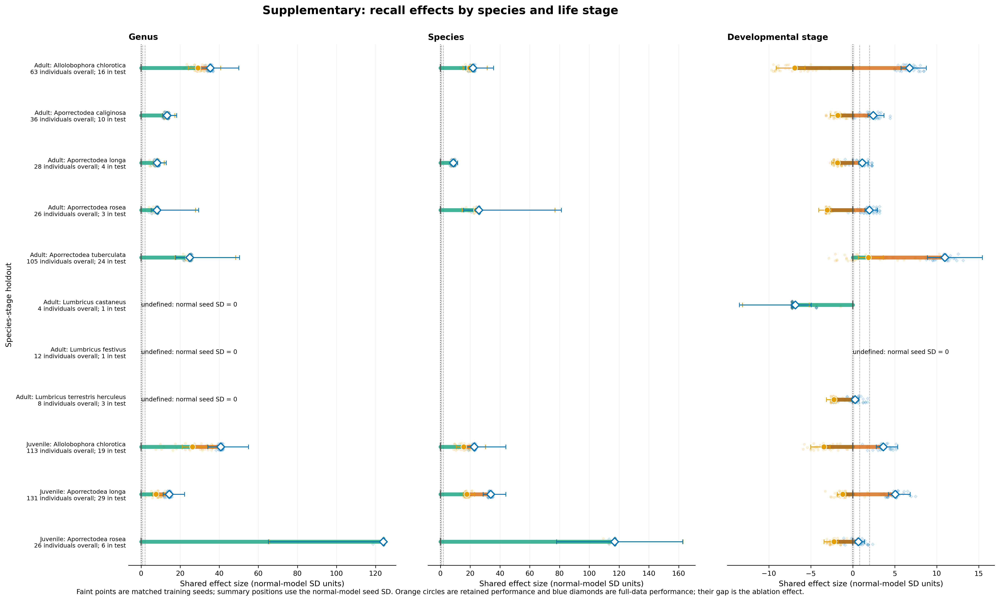

In [23]:
show_figure('supplementary_figure_01_all_species_effects_clean')

## Supplementary Figure 2 — all species-stage raw margins

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [24]:

# SUPPLEMENTARY FIGURE 2 — all species-stage raw margins + subtle seed jitter
frame=paired.copy()
if frame.empty or "combo_label" not in frame:
    print("Supplementary Figure 2: no paired species-stage rows.")
else:
    full_summary=species_effect_summary(frame)
    summary=_raw_margin_summary(full_summary)
    order_frame=frame[[c for c in ("stage","genus","species","combo_label") if c in frame]].drop_duplicates().sort_values([c for c in ("stage","genus","species") if c in frame])
    combinations=list(dict.fromkeys(order_frame["combo_label"].astype(str).tolist()))
    y=np.arange(len(combinations),dtype=float)
    fig_height=max(10.0,0.70*len(combinations)+3.2)
    fig,axes=plt.subplots(1,3,figsize=(21,fig_height),sharey=True,squeeze=False)
    jitter_rows=[]
    for task_i,task in enumerate(TASK_ORDER):
        ax=axes[0,task_i]
        current=summary[summary["task"].eq(task)].set_index("combo_label")
        for i,combo in enumerate(combinations):
            if combo not in current.index: continue
            row=current.loc[combo]
            if isinstance(row,pd.DataFrame): row=row.iloc[0]
            seed_pos=raw_margin_seed_positions(frame[frame["task"].eq(task)],identity={"combo_label":combo})
            if not seed_pos.empty:
                jit=_seed_jitter(seed_pos["seed"],width=0.075)
                ax.scatter(seed_pos["retained"],np.full(len(seed_pos),y[i])+jit,s=8,alpha=0.12,color=CB_ORANGE,marker="o",zorder=1)
                ax.scatter(seed_pos["total"],np.full(len(seed_pos),y[i])+jit,s=8,alpha=0.12,color=CB_BLUE,marker="D",zorder=1)
                for rec in seed_pos.to_dict("records"): jitter_rows.append({"task":task,"combo_label":combo,**rec})
            _draw_margin_row(ax,row,y[i],annotate=False)
        _configure_margin_axis(ax)
        ax.set_title(TASK_LABELS[task],loc="left",fontweight="bold")
        ax.set_yticks(y)
        if task_i==0:
            labels=[]
            for combo in combinations:
                rows=summary[summary["combo_label"].astype(str).eq(combo)]
                label=clean_taxon(combo)
                labels.append(_cohort_count_label(label,rows.iloc[0]) if not rows.empty else label)
            ax.set_yticklabels(labels,fontsize=7.8)
            ax.set_ylabel("Species-stage holdout")
        else: ax.tick_params(axis="y",labelleft=False)
    axes[0,0].set_ylim(len(combinations)-0.5,-0.5)
    fig.suptitle("Supplementary: raw recall margins by species and life stage",fontweight="bold",y=0.995)
    fig.text(0.5,0.012,"Faint points are matched training seeds. Orange circles are retained margins after ablation; blue diamonds are full-data margins; the connecting orange-red segment is the margin lost after ablation.",ha="center",fontsize=9)
    fig.subplots_adjust(top=0.93,bottom=0.06,left=0.23,right=0.98,wspace=0.12)
    _save_inline(fig,"supplementary_figure_02_all_species_raw_margins_clean",{"recall_seed_data":_recall_seed_data(frame),"raw_margin_decomposition":summary,"jitter_positions":pd.DataFrame(jitter_rows)},{"model":TAXON_MODEL,**_raw_margin_details()})


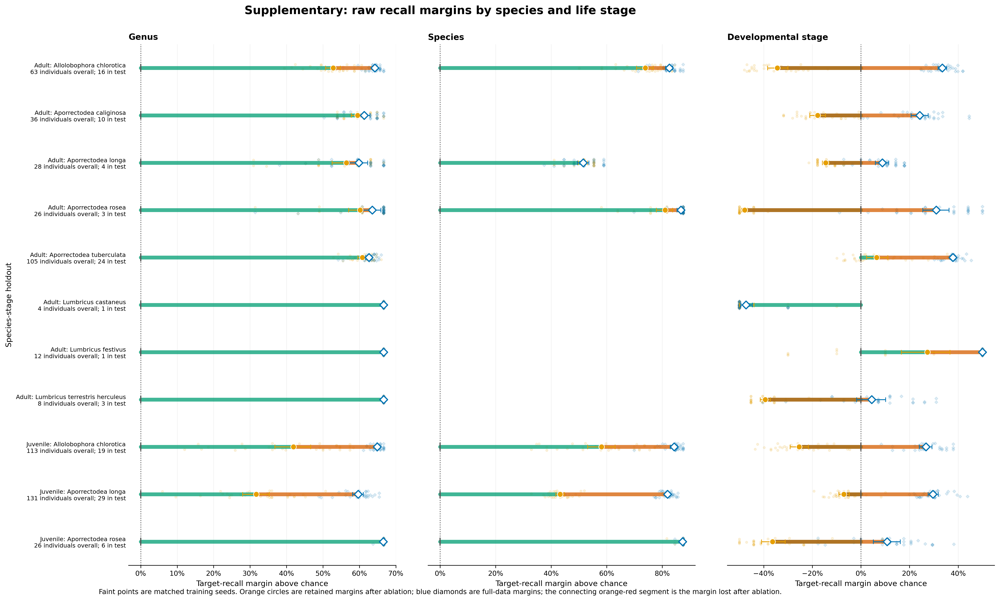

In [25]:
show_figure('supplementary_figure_02_all_species_raw_margins_clean')

## Representative transformations

The full plotting implementation is in the code cell directly below; the following cell only displays the saved PNG.

In [26]:

# REPRESENTATIVE TRANSFORMATIONS — inline plotting code
split_path = PROJECT_ROOT / "split_csv" / "test_split.csv"
if not split_path.is_file():
    split_path = PROJECT_ROOT / "test_split.csv"
if not split_path.is_file() or not DATA_ROOT.is_dir():
    print("Representative transformations: split CSV or image directory not found.")
else:
    frame = pd.read_csv(split_path)
    required = {"barcode", "rel_path_seg"}
    if not required.issubset(frame):
        print("Representative transformations: required columns are missing.")
    else:
        available = frame[frame["rel_path_seg"].map(lambda value: (DATA_ROOT / str(value)).is_file())].copy()
        barcodes = available["barcode"].dropna().astype(str).unique()
        if len(barcodes) < 5:
            print("Representative transformations: fewer than five available individuals.")
        else:
            sample_seed = 2026
            generator = np.random.default_rng(sample_seed)
            selected_barcodes = generator.choice(barcodes, size=5, replace=False)
            rows = []
            for barcode in selected_barcodes:
                candidates = available[available["barcode"].astype(str).eq(str(barcode))]
                rows.append(candidates.iloc[int(generator.integers(0, len(candidates)))])
            fig, axes = plt.subplots(5, len(REPRESENTATIVE_CONDITIONS), figsize=(25, 12.5))
            source_rows = []
            for r, row in enumerate(rows):
                image_path = DATA_ROOT / str(row["rel_path_seg"])
                source_rows.append({"row":r+1,"barcode":row["barcode"],"relative_image_path":row["rel_path_seg"],"sha256":hashlib.sha256(image_path.read_bytes()).hexdigest(),"sample_seed":sample_seed})
                image_source = Image.open(image_path).convert("RGB")
                for c,(label,condition) in enumerate(REPRESENTATIVE_CONDITIONS):
                    transform = build_split_transform(split="test", preprocessing={"image_size":224,"normalisation":{"enabled":False}}, condition=condition)
                    transformed = transform(image_source).permute(1,2,0).numpy()
                    ax=axes[r,c]
                    ax.imshow(np.clip(transformed,0.0,1.0)); ax.set_axis_off()
                    if r==0: ax.set_title(clean_label(label),fontsize=9,fontweight="bold")
                    if c==0: ax.text(-0.08,0.5,f"Individual {r+1}",transform=ax.transAxes,rotation=90,va="center",ha="right",fontsize=9)
            fig.suptitle("Representative independent-test transformations",fontweight="bold",y=0.995)
            fig.subplots_adjust(left=0.04,right=0.995,top=0.94,bottom=0.015,wspace=0.025,hspace=0.04)
            _save_inline(fig,"figure_07_representative_transformations_clean",{"selected_test_worms":pd.DataFrame(source_rows)},{"split":"test","sample_seed":sample_seed,"sampling":"five unique barcodes, one image per barcode, without replacement"})


Representative transformations: split CSV or image directory not found.


In [27]:
show_figure('figure_07_representative_transformations_clean')

Not created; completed inputs are missing: /faststorage/project/worm-species/source/publication_30seed_result/publication_bundle/figures_clean/figure_07_representative_transformations_clean.png
